# Automated Generation of Trendlines & Channels



* ### First session focused on [Automated Generation of Technical Analysis Features and the creation and testing of strategy backtesting](https://developers.lseg.com/en/article-catalog/article/automating-technical-analysis-and-strategy-backtesting-with-pyth)

* ### Second session focused on [Regime Detection](https://developers.lseg.com/en/article-catalog/article/market-regime-detection) and we demonstrated how incorporating a Hidden Markov Model can be used to achieve enhanced performance over Buy and Hold strategy

* ### In this Third session we will look into how we can Automate Generation of Trendlines and Channels and investigate the engineering of some novel features

   * ### Helpful in establishing prevailing direction, trend and strength of prices
   
   * ### Can also provide potential support and resistance points in the future
   
   * ### We can also create novel features and can guage the potential relevance of trendlines
   
       * ### Number of touches, bounces, breaks 
       
       * ### Can form the basis of enhanced alerts capability
       
       * ### Of course, people most interested in generating high probability trade signals

In [1]:
import refinitiv.data as rd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
from scipy.signal import find_peaks, peak_prominences
import math
import array
from datetime import datetime
from datetime import timedelta
import sys
rd.open_session()

<refinitiv.data.session.Definition object at 0x7f1afadc0970 {name='codebook'}>

### Functions

* ### find_next_flat_local_extreme - returns a dictionary of global extrema prices with dates

In [2]:
def find_next_flat_local_extreme(data, points, extreme_type='min'):
    trendline_vals = {}
    if points is not None and len(points) > 0:
        if extreme_type == 'min':
            global_extreme_index = data[points].idxmin() #Global Minima
        else:
            global_extreme_index = data[points].idxmax() #Global Maxima
        
        global_extreme_value = data[global_extreme_index]
        trendline_vals[f'global_{extreme_type}'] = {global_extreme_index: global_extreme_value}

        local_extremes_after = [point for point in points if point > global_extreme_index] #main condition to generate following extrema
        flattest_slope = None
        local_extreme_after_index = None

        for extreme_index in local_extremes_after:
            time_diff = (pd.to_datetime(extreme_index) - pd.to_datetime(global_extreme_index)).days #units of time
            slope = (data[extreme_index] - global_extreme_value) / time_diff  # slope
            
            if flattest_slope is None or abs(slope) < abs(flattest_slope):
                flattest_slope = slope
                local_extreme_after_index = extreme_index

        if local_extreme_after_index is not None:
            trendline_vals[f'local_{extreme_type}_after'] = {local_extreme_after_index: data[local_extreme_after_index]}

    return trendline_vals

* ### get_extreme_points - returns an list of index values for extreme points

In [3]:
def get_extreme_points(data, extreme_type= 'min'):
 
    data = data.dropna()
    if extreme_type == 'min':
        extreme_points, _ = find_peaks(-data, width=5)
    elif extreme_type == 'max':
        extreme_points, _ = find_peaks(data, width=5)
    else:
        print('Please provide valid extreme type')
        sys.exit()
 
    points_index = data[extreme_points].index
 
    if extreme_type == 'min':
        if data[-1] < np.median(data[extreme_points]):
            points_index = pd.DatetimeIndex(list(points_index) + [data.index[-1]])
        elif data[0] < np.median(data[extreme_points]):
            points_index = pd.DatetimeIndex([data.index[0]] + list(points_index))
    else:
        if data[-1] > np.median(data[extreme_points]):
            points_index =  pd.DatetimeIndex(list(points_index) + [data.index[-1]])
        elif data[0] > np.median(data[extreme_points]):
            points_index = pd.DatetimeIndex([data.index[0]] + list(points_index))
 
    return points_index

* ### extrapolate_y_value - returns an extrapolation of time values

In [4]:
def extrapolate_y_value(date1, y1, date2, y2, date3):

    delta_days_1_2 = (date2 - date1).days
    delta_days_1_3 = (date3 - date1).days
    change_per_day = (y2 - y1) / delta_days_1_2    
    y3 = y1 + change_per_day * delta_days_1_3
    
    return y3

* ### extrapolate_prices - returns an extrapolation of time and price values

In [5]:
def extrapolate_prices(data, trendline_vals, extrapolate_n, extreme_type = 'min'):
    extrapolated_vals = {}
    global_date = list(trendline_vals[f'global_{extreme_type}'].keys())[0]
    global_price = list(trendline_vals[f'global_{extreme_type}'].values())[0]

    if f'local_{extreme_type}_after' in list(trendline_vals.keys()):
        local_after_date = list(trendline_vals[f'local_{extreme_type}_after'].keys())[0]
        local_after_price = list(trendline_vals[f'local_{extreme_type}_after'].values())[0]
    else:
        print(f'Global {extreme_type} is also the local {extreme_type}, will not be able to provide line for {extreme_type}')
        return []
    date1, y1 = global_date, global_price
    date2, y2 = local_after_date, local_after_price
    for date in data.index:
        extrapolated_vals[date] = extrapolate_y_value(date1, y1, date2, y2, date)
    for _ in range(1, extrapolate_n):
        date += timedelta(days=1)
        extrapolated_vals[date] = extrapolate_y_value(date1, y1, date2, y2, date)


    return pd.Series(extrapolated_vals)


* ### get_offset - calculates the parallel channel offset

In [6]:
def get_offset(data, eligible_locals, extraploated_data_df, extreme_type = 'max'):
    if len(eligible_locals) and len(extraploated_data_df):
        dates, prices = extraploated_data_df.index, extraploated_data_df.values
        for i, local_val in enumerate(eligible_locals.index):
            extrapolated_val = extrapolate_y_value(dates[0], prices[0], dates[1], prices[1], local_val)
            offset_val = abs(extrapolated_val - data[local_val])
            extraploated_data_df_offset = extraploated_data_df - offset_val if extreme_type == 'max' else extraploated_data_df + offset_val
            for j, next_local_val in enumerate(eligible_locals.index[i+1:]):
                extrapolated_val_next = extrapolate_y_value(dates[0], prices[0], dates[1], prices[1], next_local_val)
                if (extreme_type == 'min' and extrapolated_val_next + 
                    offset_val < eligible_locals[next_local_val]) or \
                (extreme_type == 'max' and extrapolated_val_next - offset_val > eligible_locals[next_local_val]):
                    break
                elif j == len(eligible_locals.index[i+1:]) - 1:
                    return extraploated_data_df_offset
                else:
                    continue
        return extraploated_data_df_offset
    else:
        print("There are no eligible locals")

* ### build_feature_df - builds main dataframe containing all features to be used in plotting

In [7]:
def build_feature_df(prices_df, sector_df):
    all_stock_df = {}
    keys = []
    for stock in sector_df['Instrument']:
        prices_df_stock = prices_df[stock]
        prices = prices_df_stock['TRDPRC_1']
        if not math.isnan(prices[0]):
            peaks_index_stock, lows_index_stock = get_extreme_points(prices, 'max'), get_extreme_points(prices)
            trendline_vals_min_stock = find_next_flat_local_extreme(prices, lows_index_stock)
            trendline_vals_max_stock = find_next_flat_local_extreme(prices, peaks_index_stock, 'max')
            if len(trendline_vals_min_stock) ==  len(trendline_vals_max_stock) == 2:
                extraploated_data_df_min_stock = extrapolate_prices(prices, trendline_vals_min_stock, 100, 'min')
                extraploated_data_df_max_stock = extrapolate_prices(prices, trendline_vals_max_stock, 100, 'max')
                eligible_local_min_stock = prices[lows_index_stock][prices[lows_index_stock].index > list(trendline_vals_max_stock['global_max'].keys())[0]]
                eligible_local_max_stock = prices[peaks_index_stock][prices[peaks_index_stock].index > list(trendline_vals_min_stock['global_min'].keys())[0]]  
                if len(eligible_local_min_stock) > 0 and  len(eligible_local_max_stock) > 0:
                    extraploated_data_df_max_offset_stock = get_offset(prices, eligible_local_min_stock, extraploated_data_df_max_stock, extreme_type = 'max')
                    extraploated_data_df_min_offset_stock = get_offset(prices, eligible_local_max_stock, extraploated_data_df_min_stock, extreme_type = 'min')
                    mid_max_stock  = (extraploated_data_df_max_stock + extraploated_data_df_max_offset_stock)/2
                    mid_min_stock = (extraploated_data_df_min_stock + extraploated_data_df_min_offset_stock)/2
                    
                    new_df = pd.concat([prices_df_stock, extraploated_data_df_max_stock, mid_max_stock, extraploated_data_df_max_offset_stock, extraploated_data_df_min_stock, mid_min_stock, extraploated_data_df_min_offset_stock],axis = 1)
                    new_df.columns = ['open', 'high', 'low', 'close', 'down_trend_res','down_trend_mid', 'down_trend_sup',  'up_trend_res',  'up_trend_mid', 'up_trend_sup']
                    new_df['Sector'] = sector_df[sector_df['Instrument'] == stock]['TRBC Industry Group Name'].values[0]
                    for col in new_df[['down_trend_res','down_trend_mid', 'down_trend_sup',  'up_trend_res',  'up_trend_mid', 'up_trend_sup']]:
                        new_df[f'distance_to_close_{col}'] = abs(new_df['close'] - new_df[col])
                    # new_df = add_alert(new_df)
                    keys.append(stock)
                    all_stock_df[stock] = new_df
                else:
                    print('Missing Eligable local extrema to build offset lines', stock)
            else:
                print('Missing extrema to build offset lines', stock)
        else:
            print("Prices not found", stock)

    all_stock_df = pd.concat(all_stock_df.values(), axis=1, keys=all_stock_df.keys())
    return all_stock_df


* ### plot_trendlines - main plotting routine for prices, extrema, tendlines and alerts

In [8]:
def plot_trendlines(all_stock_df, stock):
    stock_df = all_stock_df[stock]
    
    peaks_index_stock, lows_index_stock = get_extreme_points(stock_df['close'], 'max'), get_extreme_points(stock_df['close'])
    trendline_vals_min_stock = find_next_flat_local_extreme(stock_df['close'], lows_index_stock)
    trendline_vals_max_stock = find_next_flat_local_extreme(stock_df['close'], peaks_index_stock, 'max')

    global_high_date, global_low_date = list(trendline_vals_max_stock['global_max'].keys())[0], list(trendline_vals_min_stock['global_min'].keys())[0]
    
    plt.figure(figsize=(20,10))
    plt.plot(stock_df['close'])
    plt.plot(stock_df['close'][peaks_index_stock],"x")
    plt.plot(stock_df['close'][lows_index_stock],"x")
    plt.plot(stock_df['down_trend_res'][global_high_date:])
    plt.plot(stock_df['down_trend_sup'][global_high_date:])
    plt.plot(stock_df['up_trend_res'][global_low_date:])
    plt.plot(stock_df['up_trend_sup'][global_low_date:])
    plt.plot(stock_df['down_trend_mid'][global_high_date:],linestyle='dashed')
    plt.plot(stock_df['up_trend_mid'][global_low_date:],linestyle='dashed')
    plt.plot(stock_df[stock_df['distance_to_close_down_trend_mid'] < stock_df['close']/100]['close'][global_high_date:], marker='o', linestyle='none')
    plt.plot(stock_df[stock_df['distance_to_close_down_trend_res'] < stock_df['close']/100]['close'][global_high_date:], marker='o', linestyle='none')
    plt.plot(stock_df[stock_df['distance_to_close_down_trend_sup'] < stock_df['close']/100]['close'][global_high_date:], marker='o', linestyle='none')
    plt.plot(stock_df[stock_df['distance_to_close_up_trend_mid'] < stock_df['close']/100]['close'][global_low_date:], marker='o', linestyle='none')
    plt.plot(stock_df[stock_df['distance_to_close_up_trend_res'] < stock_df['close']/100]['close'][global_low_date:], marker='o', linestyle='none')
    plt.plot(stock_df[stock_df['distance_to_close_up_trend_sup'] < stock_df['close']/100]['close'][global_low_date:], marker='o', linestyle='none')
    plt.show()

### RD Lib API call to get list of FTSE components

* #### can also be a list of your own universe=["PORTFOLIO(your_portfolio)"]

In [9]:
sector_df = rd.get_data(universe=["0#.FTSE"], fields="TR.TRBCIndustryGroup")
sector_df

,Instrument,TRBC Industry Group Name
0,STAN.L,Banking Services
1,CRDA.L,Chemicals
2,ANTO.L,Metals & Mining
3,BNZL.L,Diversified Industrial Goods Wholesale
4,SGE.L,Software & IT Services
...,...,...
95,EDV.L,Metals & Mining
96,OCDO.L,Diversified Retail
97,LSEG.L,Investment Banking & Investment Services
98,TSCO.L,Food & Drug Retailing


### RD Lib API call to get OHLC prices for all index components

In [10]:
prices_df = rd.get_history(universe=sector_df['Instrument'].to_list(), fields=["OPEN_PRC", "HIGH_1", "LOW_1","TRDPRC_1"], interval="1D",
               start = '2020-01-01', end = '2023-02-28'
               ).astype(float)
prices_df

STAN.L                            CRDA.L                  \
           OPEN_PRC HIGH_1  LOW_1   TRDPRC_1 OPEN_PRC  HIGH_1   LOW_1   
Date                                                                    
2020-01-02    712.4  724.0  711.0  720.00000   5140.0  5155.0  5100.0   
2020-01-03    713.2  720.8  709.6  712.40000   5065.0  5095.0  5060.0   
2020-01-06    712.0  712.4  698.4  707.00000   5040.0  5120.0  5025.0   
2020-01-07    707.6  709.4  698.6  701.60000   5095.0  5130.0  5080.0   
2020-01-08    695.2  700.8  687.0  698.80000   5065.0  5130.0  5060.0   
...             ...    ...    ...        ...      ...     ...     ...   
2023-02-22    762.6  768.0  754.2  761.59805   6956.0  7018.0  6856.0   
2023-02-23    754.6  764.8  740.2  746.19640   7006.0  7040.0  6922.0   
2023-02-24    760.4  779.0  760.4  770.92722   6962.0  6992.0  6840.0   
2023-02-27    775.0  795.6  769.8  785.76366   6944.0  6986.0  6852.0   
2023-02-28    783.2  799.4  777.0  790.70229   6710.0  6766.0  6490.0   

                         ANTO.L          ...  LSEG.L                  TSCO.L  \
              TRDPRC_1 OPEN_PRC  HIGH_1  ...   LOW_1    TRDPRC_1    OPEN_PRC   
Date                                     ...                                   
2020-01-02  5100.00000    925.0   947.2  ...  7674.0  7700.00000  255.825998   
2020-01-03  5080.00000    936.0   936.2  ...  7580.0  7638.00000  252.530816   
2020-01-06  5095.00000    916.0   918.2  ...  7494.0  7500.00000  252.730524   
2020-01-07  5090.00000    911.4   925.8  ...  7424.0  7440.00000  253.729064   
2020-01-08  5070.00000    923.8   932.0  ...  7360.0  7531.37405  251.532275   
...                ...      ...     ...  ...     ...         ...         ...   
2023-02-22  6909.42857   1695.5  1709.5  ...  7470.0  7535.18090  250.000000   
2023-02-23  6967.57143   1674.0  1677.0  ...  7480.0  7496.00000  248.600000   
2023-02-24  6864.00000   1580.5  1599.5  ...  7478.0  7536.00000  249.600000   
2023-02-27  6906.00000   1540.0  1582.0  ...  7484.0  7507.38268  247.100000   
2023-02-28  6641.18423   1554.5  1583.0  ...  7380.0  7432.93182  254.900000   

                                                 LGEN.L                \
                HIGH_1       LOW_1    TRDPRC_1 OPEN_PRC HIGH_1  LOW_1   
Date                                                                    
2020-01-02  257.523517  254.827458  255.426582    306.2  312.4  305.3   
2020-01-03  255.825998  251.532275  254.727604    311.7  311.7  304.8   
2020-01-06  254.827458  251.432421  253.629210    303.1  305.0  300.0   
2020-01-07  257.423663  253.229794  254.128480    305.7  310.0  304.3   
2020-01-08  253.129940  248.836217  251.831837    305.5  308.8  303.1   
...                ...         ...         ...      ...    ...    ...   
2023-02-22  250.400000  247.000000  248.875670    252.7  254.6  250.3   
2023-02-23  250.500000  248.600000  248.600000    251.8  255.4  251.8   
2023-02-24  249.700000  246.500000  247.526610    254.1  256.3  252.6   
2023-02-27  255.700000  245.900000  252.246020    255.9  258.1  255.4   
2023-02-28  257.000000  252.300000  253.899100    255.9  260.2  254.2   

                       
             TRDPRC_1  
Date                   
2020-01-02  311.00000  
2020-01-03  306.00000  
2020-01-06  305.00000  
2020-01-07  307.20000  
2020-01-08  308.10000  
...               ...  
2023-02-22  251.42742  
2023-02-23  253.70000  
2023-02-24  253.59527  
2023-02-27  256.60000  
2023-02-28  255.79566  

[799 rows x 400 columns]

### Execute generation of main feature dataframe given our OHLC data and Instrument list

In [11]:
all_stock_df = build_feature_df(prices_df, sector_df)
all_stock_df

Missing extrema to build offset lines STAN.L
Missing extrema to build offset lines REL.L
Missing Eligable local extrema to build offset lines SMIN.L
Missing extrema to build offset lines HSBA.L
Missing Eligable local extrema to build offset lines TW.L
Missing extrema to build offset lines III.L
Missing extrema to build offset lines CNA.L
Prices not found HLN.L
Missing Eligable local extrema to build offset lines IMB.L
Missing Eligable local extrema to build offset lines BRBY.L
Missing Eligable local extrema to build offset lines BP.L
Missing Eligable local extrema to build offset lines IHG.L
Prices not found PSN.L
Missing Eligable local extrema to build offset lines SHEL.L
Missing Eligable local extrema to build offset lines VOD.L
Missing Eligable local extrema to build offset lines FCIT.L
Missing extrema to build offset lines BAES.L
Prices not found EDV.L


CRDA.L                                                        \
              open    high     low   close down_trend_res down_trend_mid   
2020-01-02  5140.0  5155.0  5100.0  5100.0   15871.300716   14362.552506   
2020-01-03  5065.0  5095.0  5060.0  5080.0   15863.579952   14354.831742   
2020-01-06  5040.0  5120.0  5025.0  5095.0   15840.417661   14331.669451   
2020-01-07  5095.0  5130.0  5080.0  5090.0   15832.696897   14323.948687   
2020-01-08  5065.0  5130.0  5060.0  5070.0   15824.976134   14316.227924   
...            ...     ...     ...     ...            ...            ...   
2023-06-03     NaN     NaN     NaN     NaN    6235.787589    4727.039379   
2023-06-04     NaN     NaN     NaN     NaN    6228.066826    4719.318616   
2023-06-05     NaN     NaN     NaN     NaN    6220.346062    4711.597852   
2023-06-06     NaN     NaN     NaN     NaN    6212.625298    4703.877088   
2023-06-07     NaN     NaN     NaN     NaN    6204.904535    4696.156325   

                                                                   ...  \
           down_trend_sup up_trend_res up_trend_mid  up_trend_sup  ...   
2020-01-02   12853.804296  3873.243325  6324.148601   8775.053877  ...   
2020-01-03   12846.083532  3875.545509  6326.450785   8777.356061  ...   
2020-01-06   12822.921241  3882.452060  6333.357336   8784.262612  ...   
2020-01-07   12815.200477  3884.754244  6335.659520   8786.564796  ...   
2020-01-08   12807.479714  3887.056427  6337.961704   8788.866980  ...   
...                   ...          ...          ...           ...  ...   
2023-06-03    3218.291169  6746.368694  9197.273970  11648.179246  ...   
2023-06-04    3210.570406  6748.670878  9199.576154  11650.481430  ...   
2023-06-05    3202.849642  6750.973061  9201.878338  11652.783614  ...   
2023-06-06    3195.128878  6753.275245  9204.180521  11655.085798  ...   
2023-06-07    3187.408115  6755.577429  9206.482705  11657.387981  ...   

                 LGEN.L                            \
           up_trend_res up_trend_mid up_trend_sup   
2020-01-02   132.482394   197.094692   261.706990   
2020-01-03   132.557920   197.170218   261.782516   
2020-01-06   132.784498   197.396796   262.009094   
2020-01-07   132.860024   197.472322   262.084620   
2020-01-08   132.935550   197.547848   262.160146   
...                 ...          ...          ...   
2023-06-03   226.738837   291.351135   355.963433   
2023-06-04   226.814363   291.426661   356.038959   
2023-06-05   226.889889   291.502187   356.114485   
2023-06-06   226.965415   291.577713   356.190011   
2023-06-07   227.040941   291.653239   356.265537   

                                                      \
                                              Sector   
2020-01-02  Investment Banking & Investment Services   
2020-01-03  Investment Banking & Investment Services   
2020-01-06  Investment Banking & Investment Services   
2020-01-07  Investment Banking & Investment Services   
2020-01-08  Investment Banking & Investment Services   
...                                              ...   
2023-06-03  Investment Banking & Investment Services   
2023-06-04  Investment Banking & Investment Services   
2023-06-05  Investment Banking & Investment Services   
2023-06-06  Investment Banking & Investment Services   
2023-06-07  Investment Banking & Investment Services   

                                                                              \
           distance_to_close_down_trend_res distance_to_close_down_trend_mid   
2020-01-02                         8.136679                        81.507835   
2020-01-03                        13.121276                        76.523238   
2020-01-06                        14.075066                        75.569448   
2020-01-07                        11.859663                        77.784851   
2020-01-08                        10.944260                        78.700254   
...                                     ...                              ...   
2

### Count number of valid stocks

In [12]:
len(all_stock_df.columns.get_level_values(0).unique())

82

### Plot charts for all valid stocks

CRDA.L


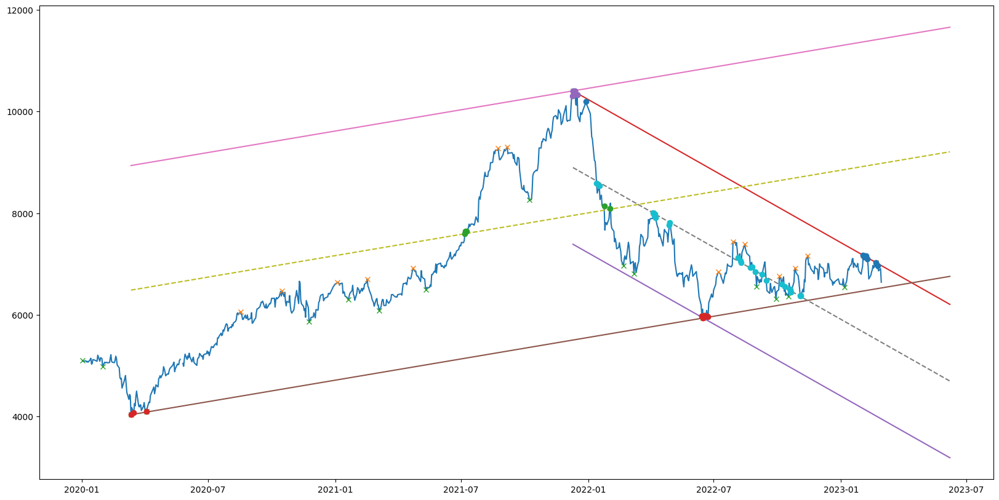

ANTO.L


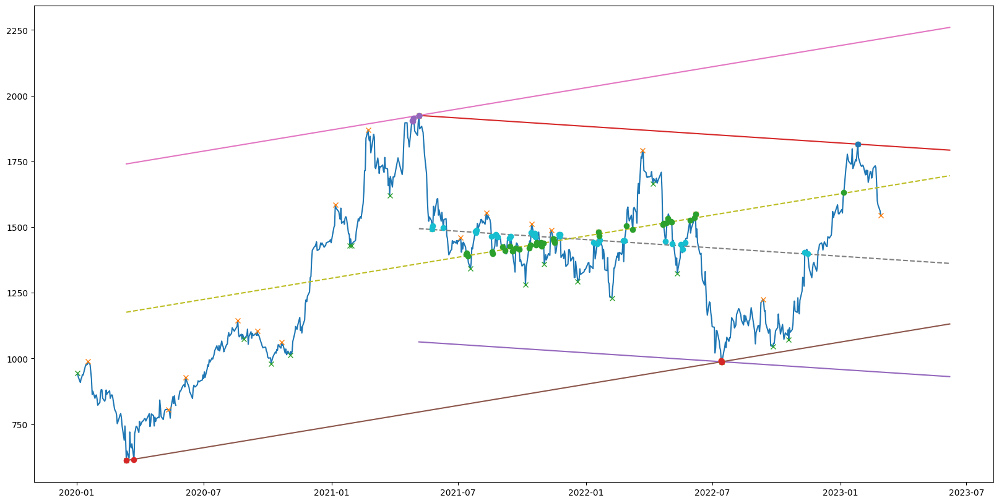

BNZL.L


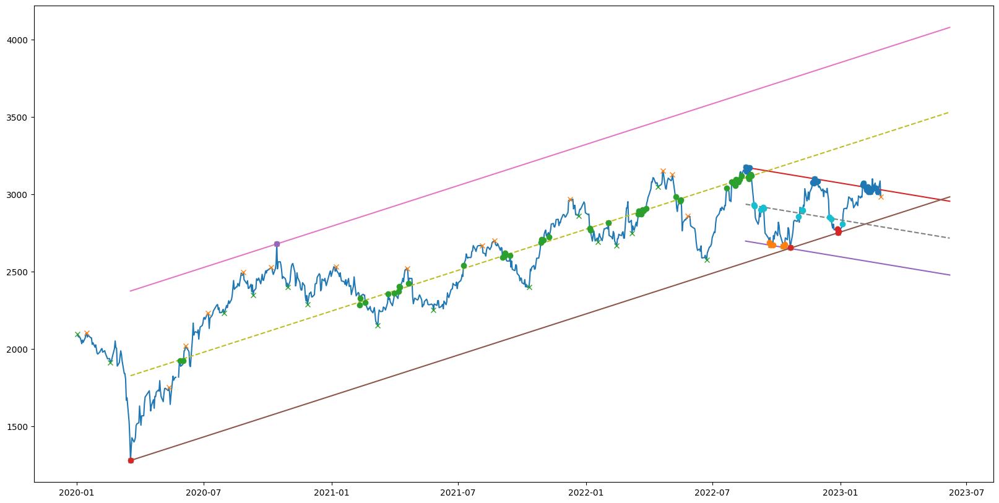

SGE.L


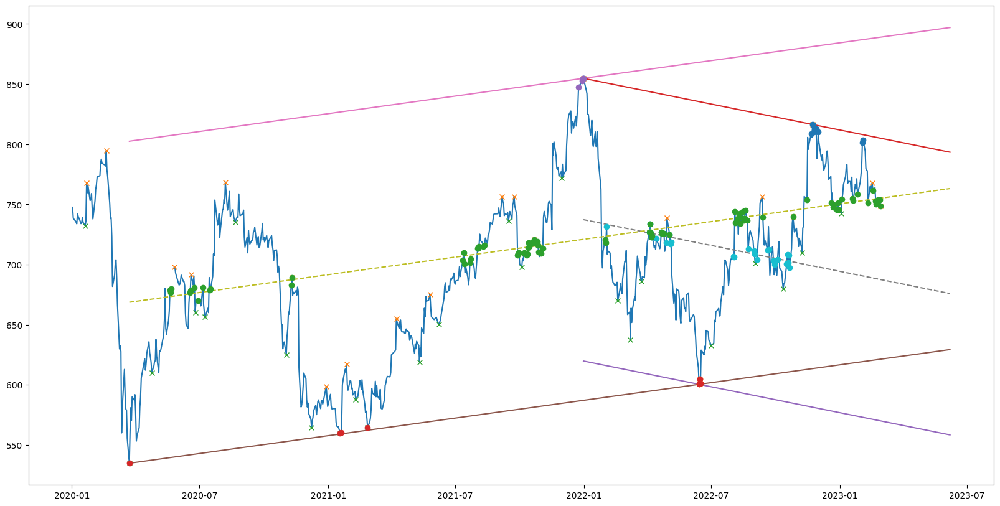

SVT.L


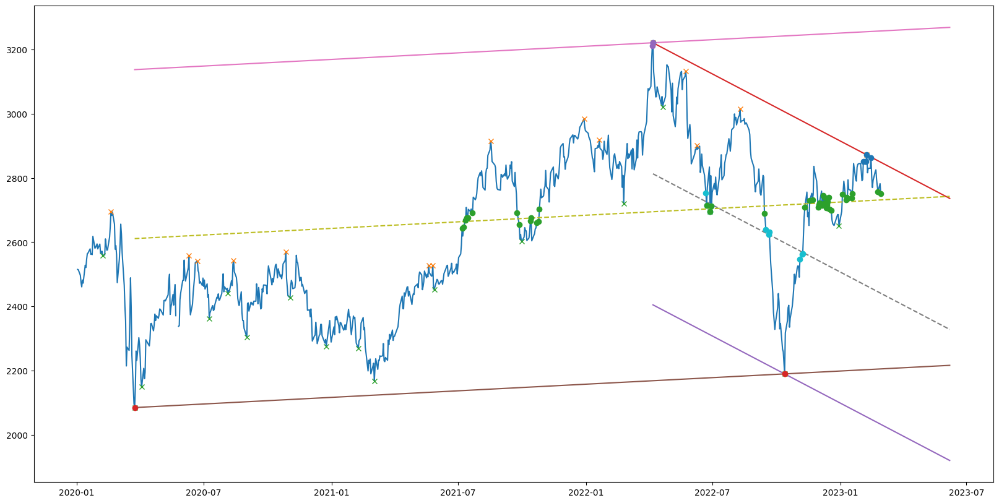

ICAG.L


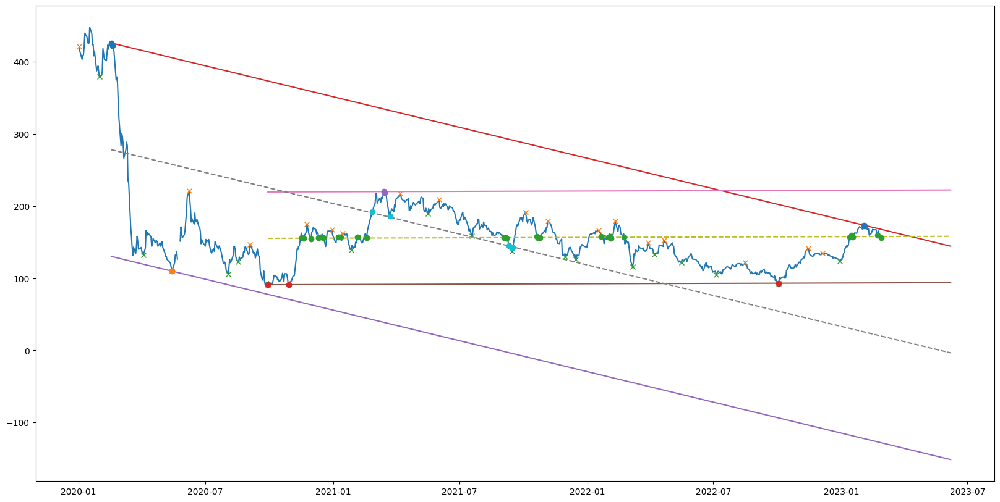

AZN.L


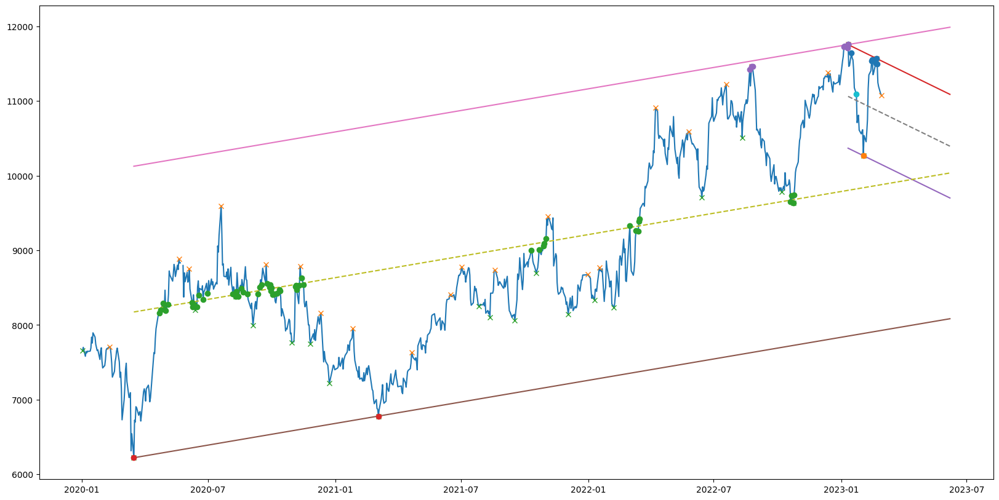

CTEC.L


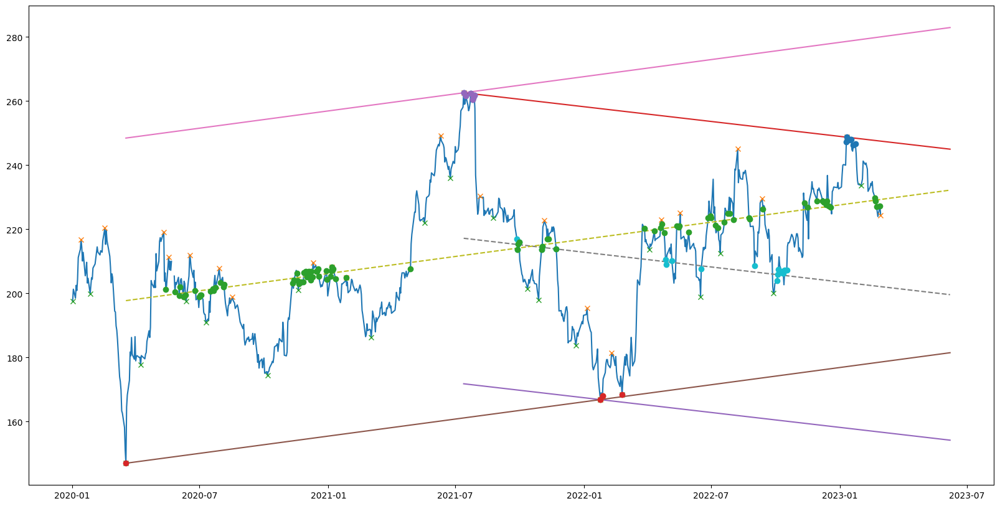

WPP.L


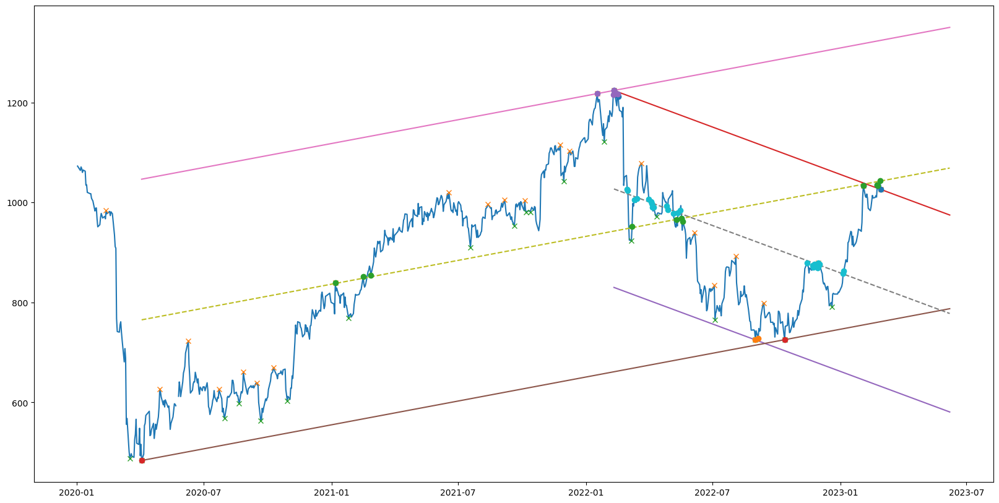

FRES.L


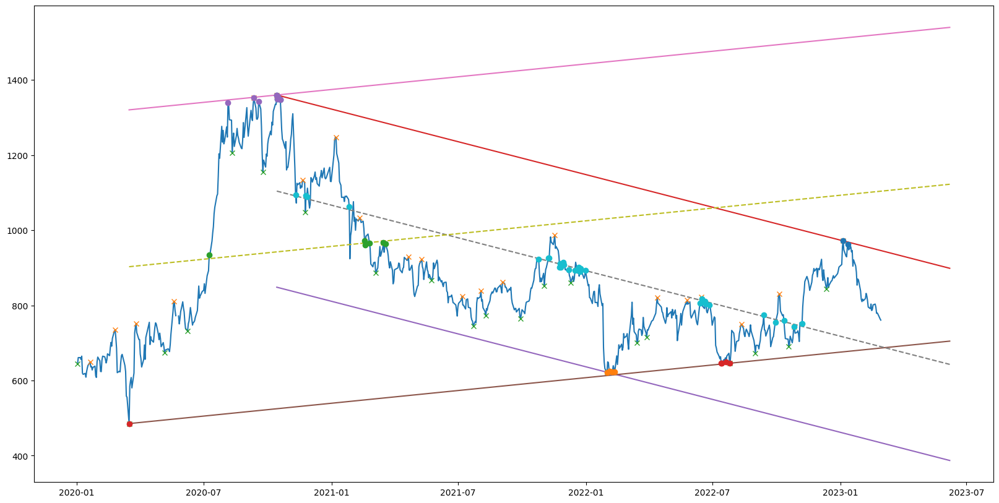

AAF.L


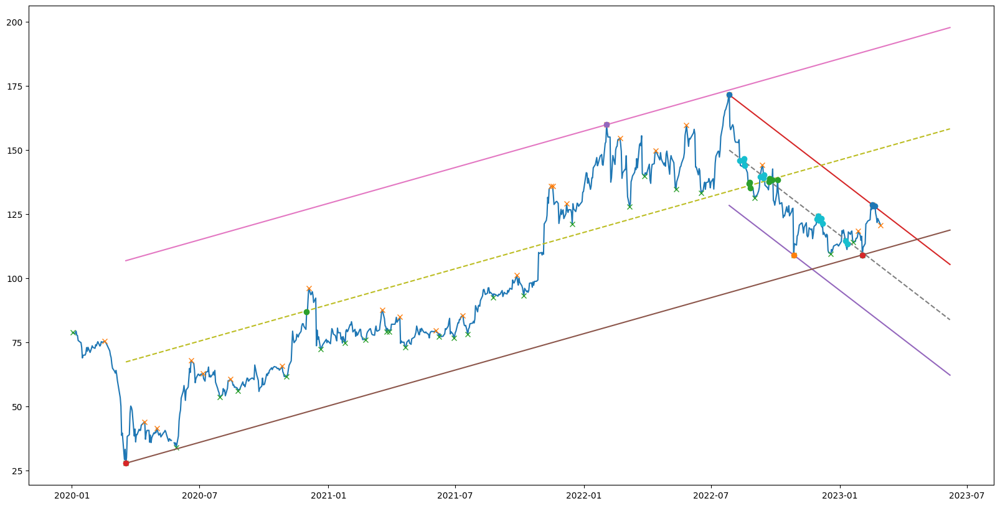

HWDN.L


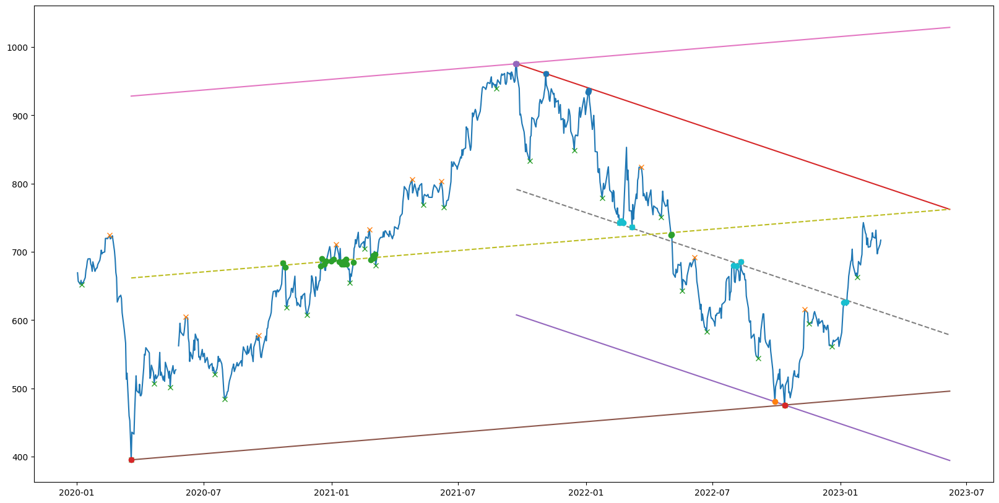

SGRO.L


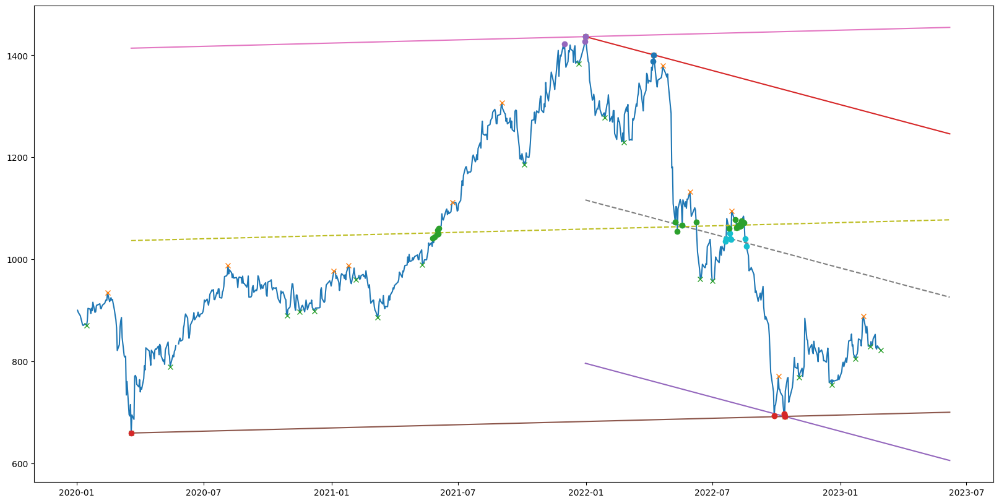

SJP.L


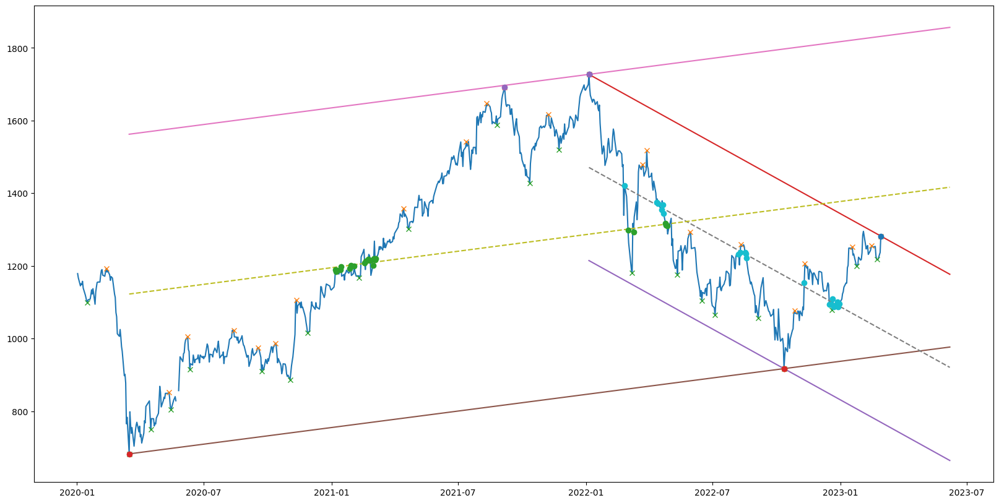

AHT.L


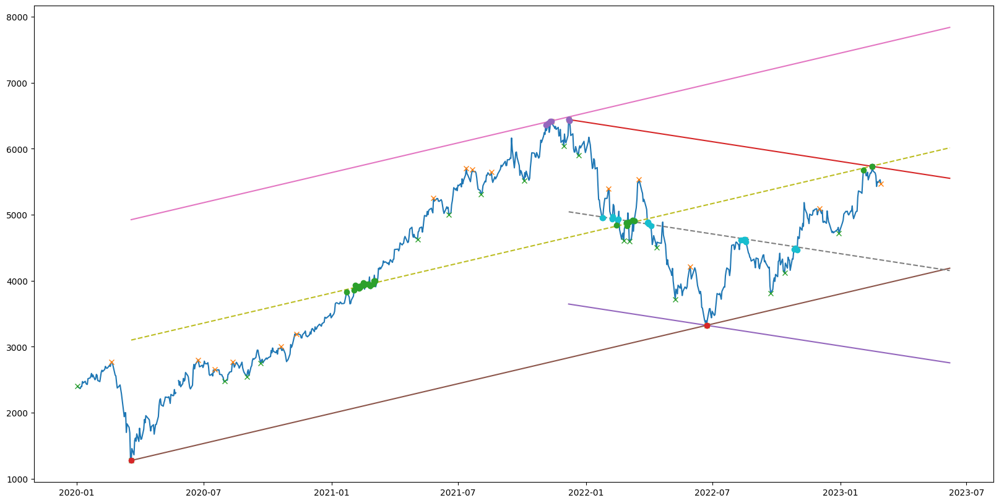

HLMA.L


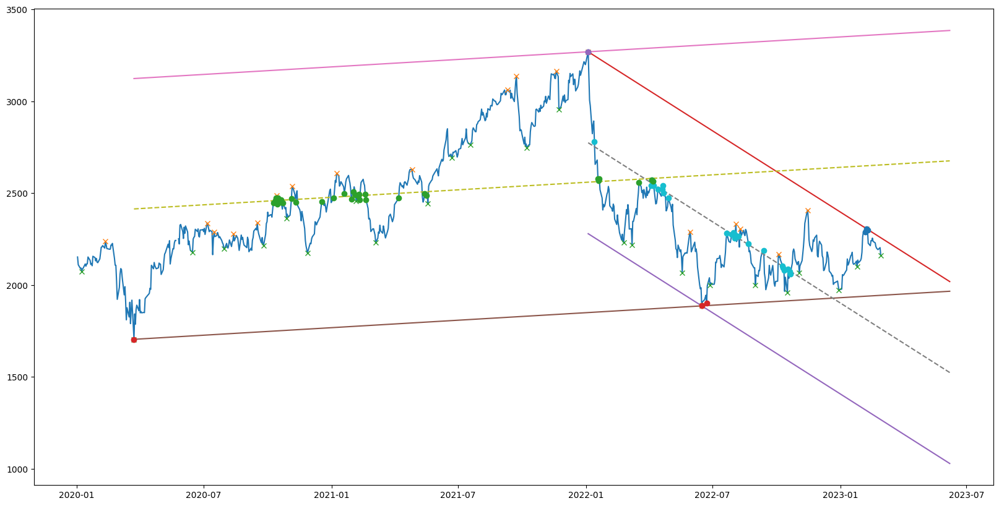

HIK.L


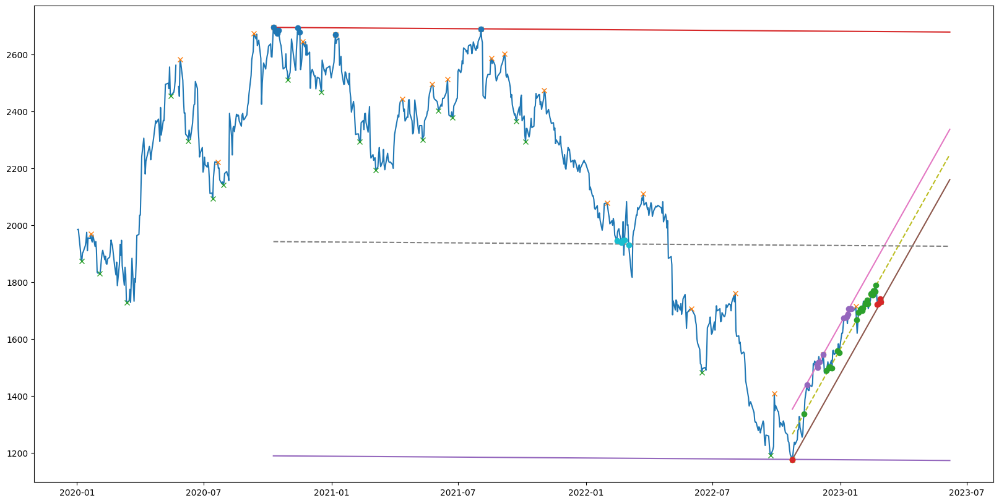

MNG.L


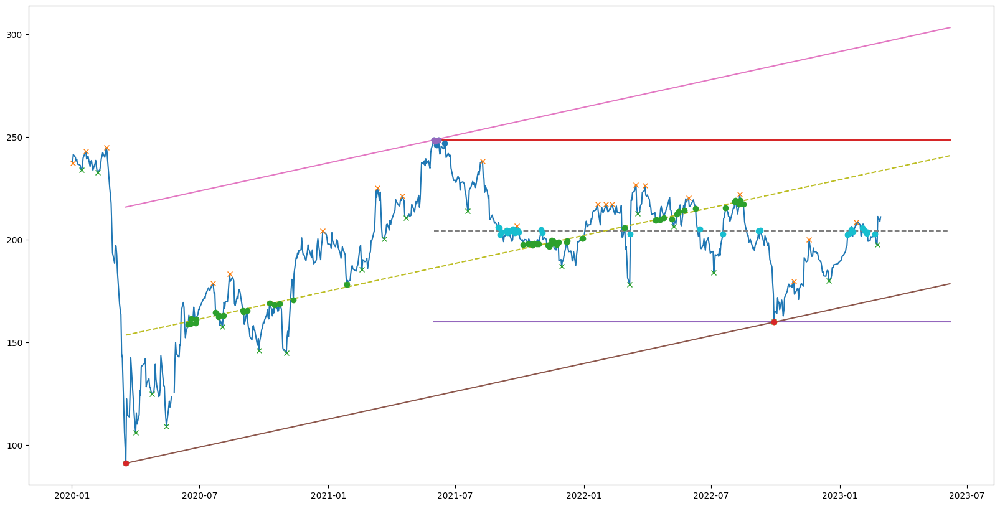

BKGH.L


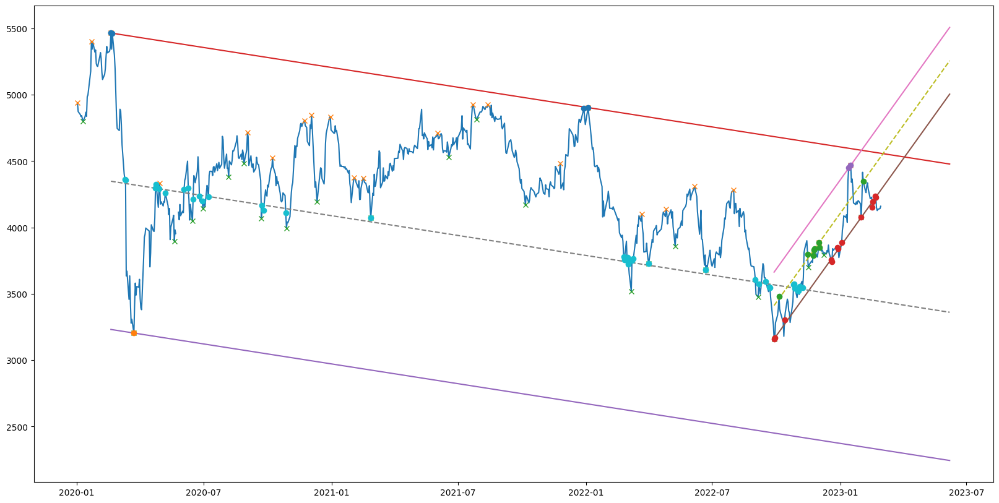

SMDS.L


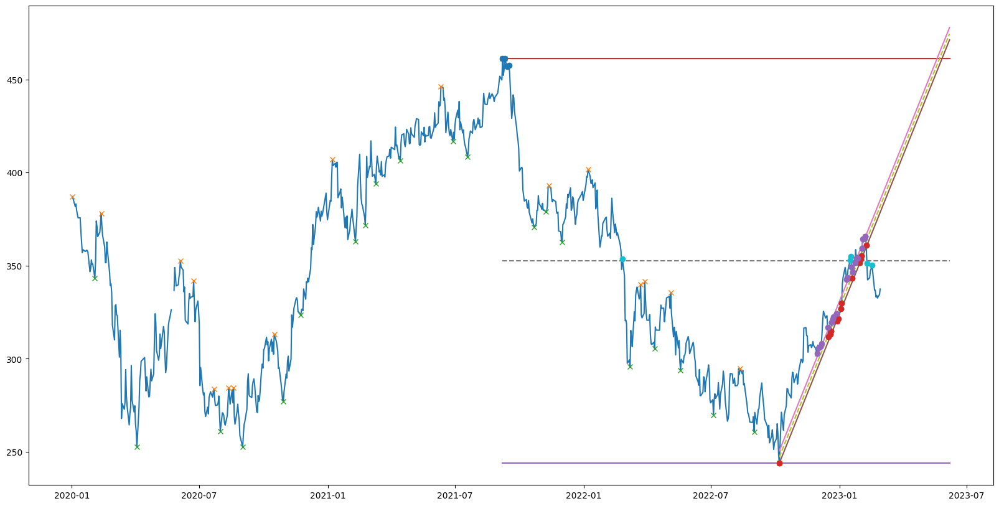

NG.L


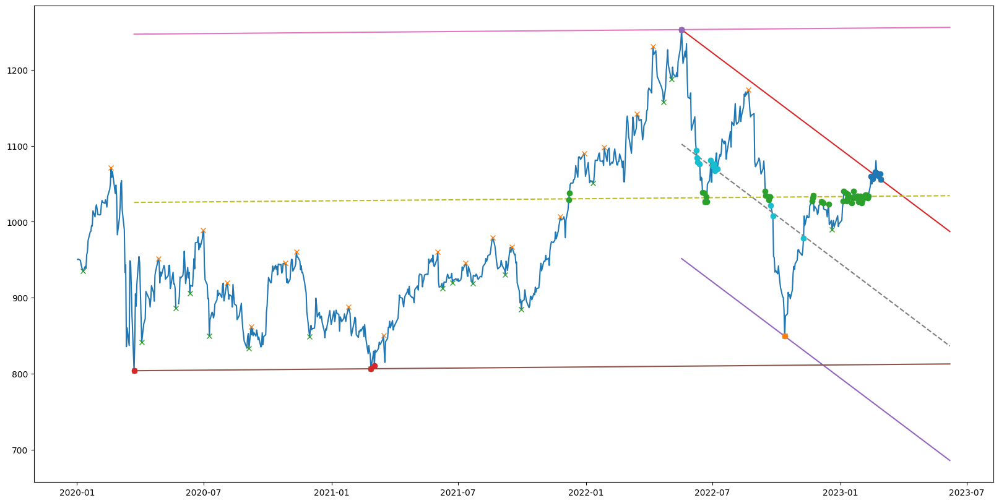

RKT.L


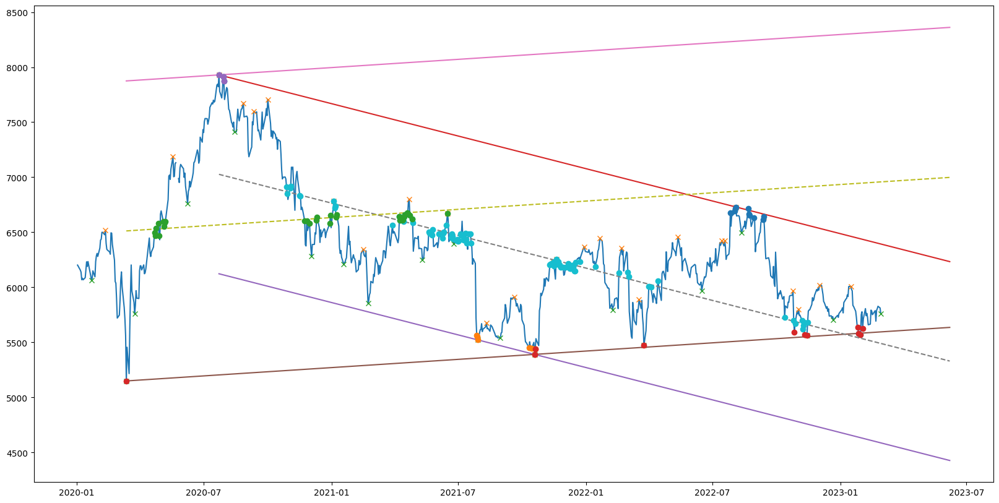

SKG.L


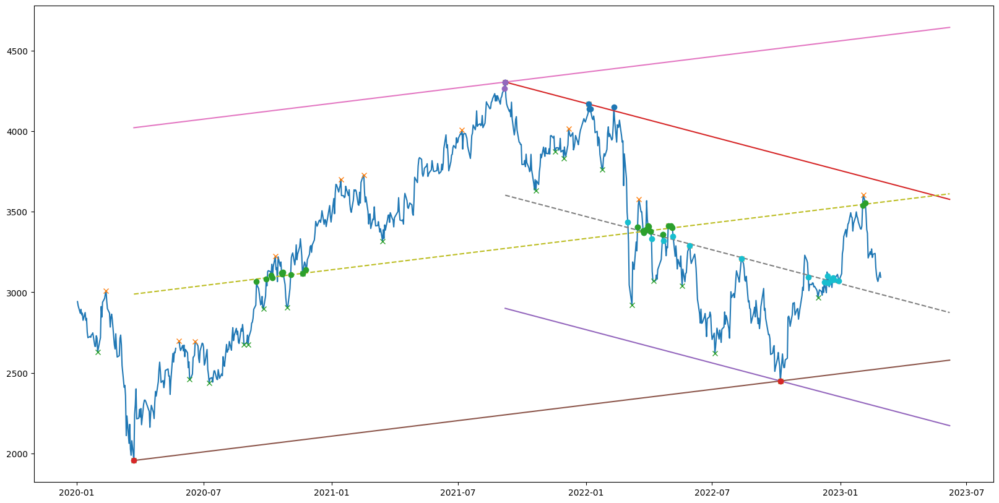

WEIR.L


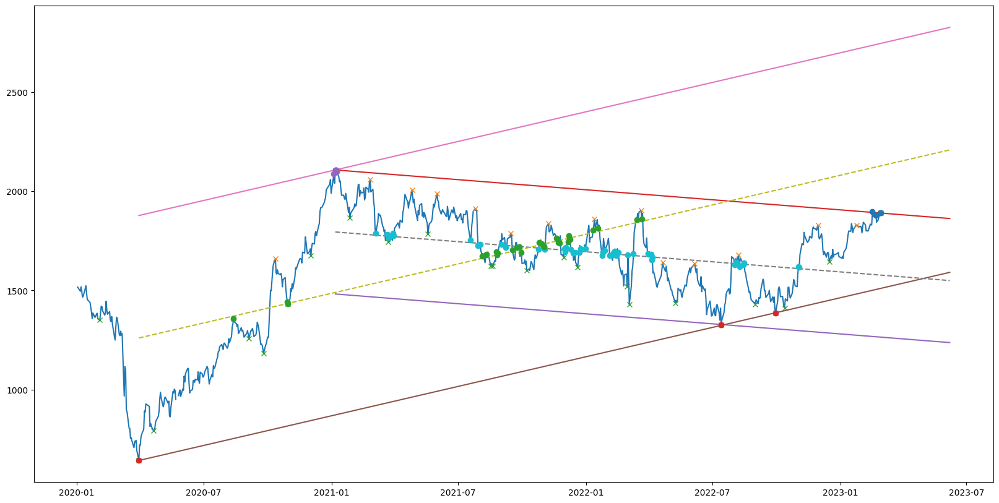

IMI.L


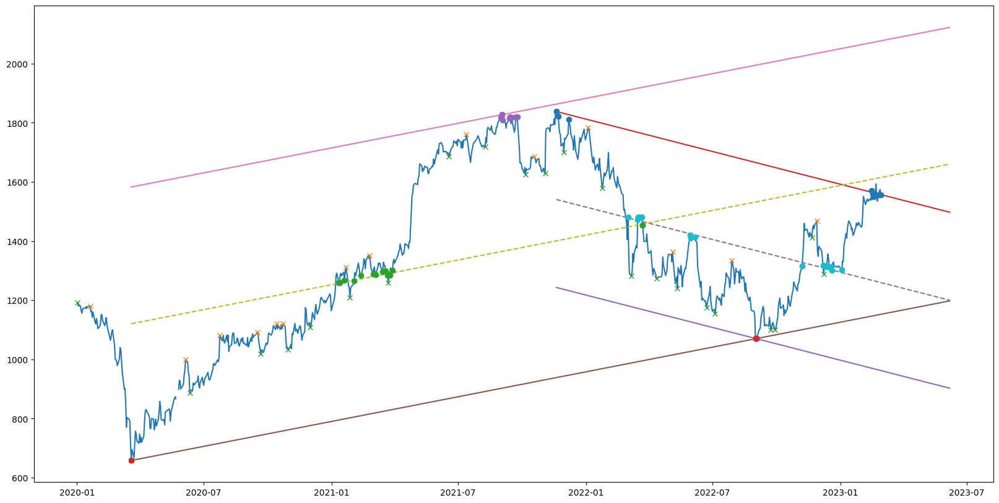

MRON.L


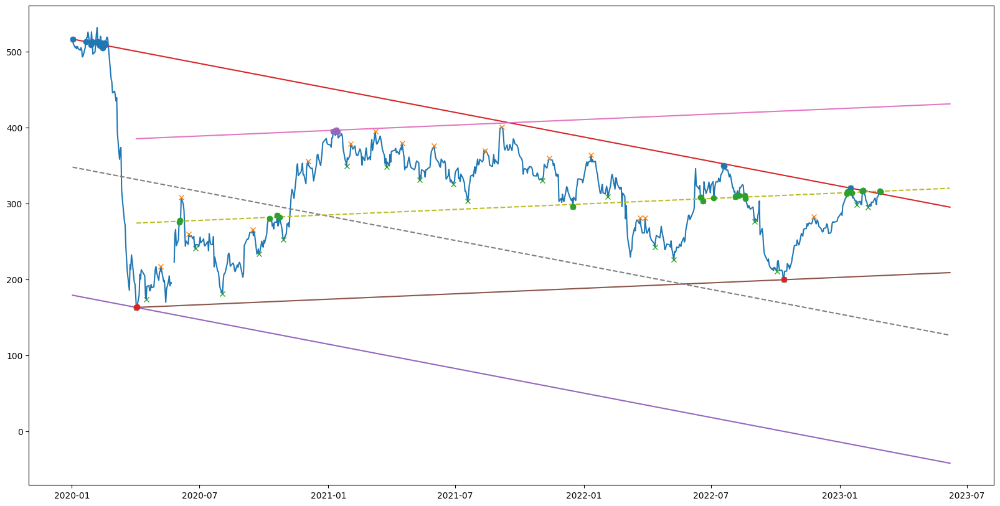

CPG.L


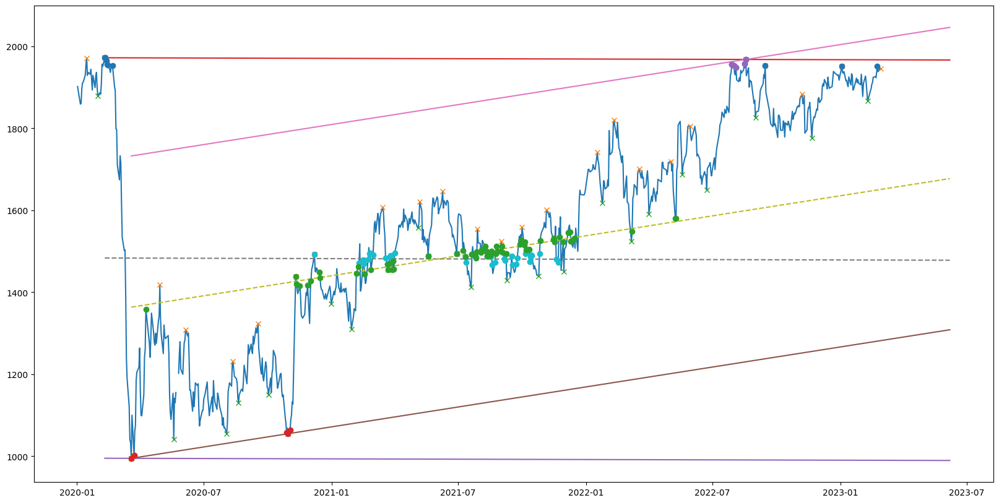

AUTOA.L


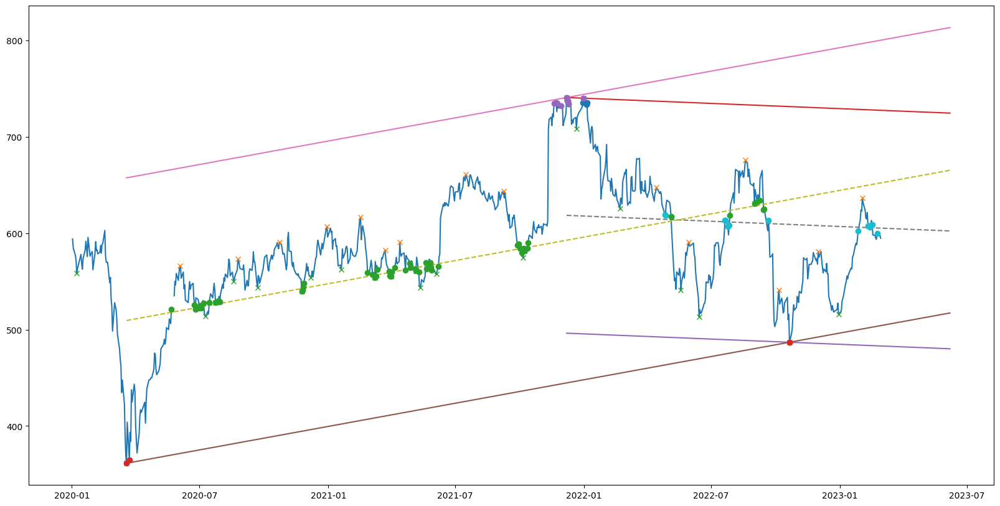

AV.L


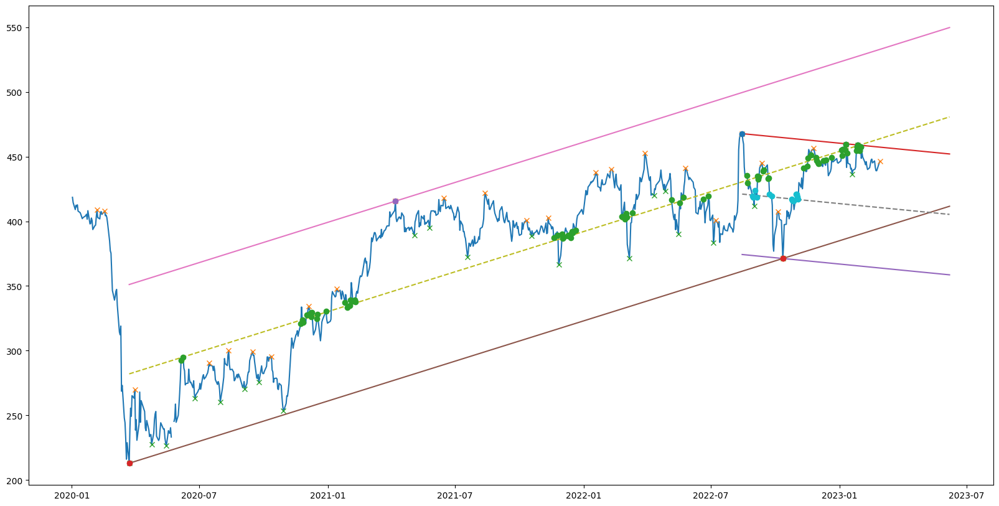

ENT.L


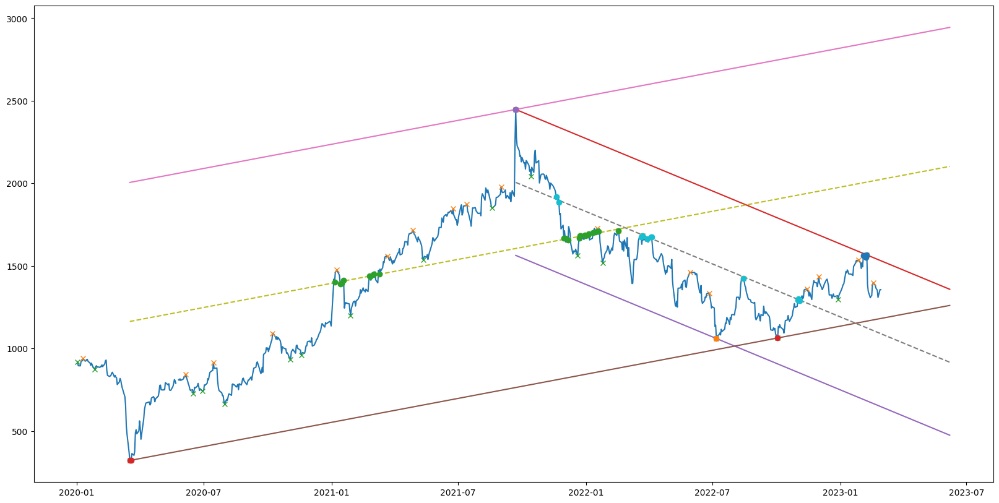

DGE.L


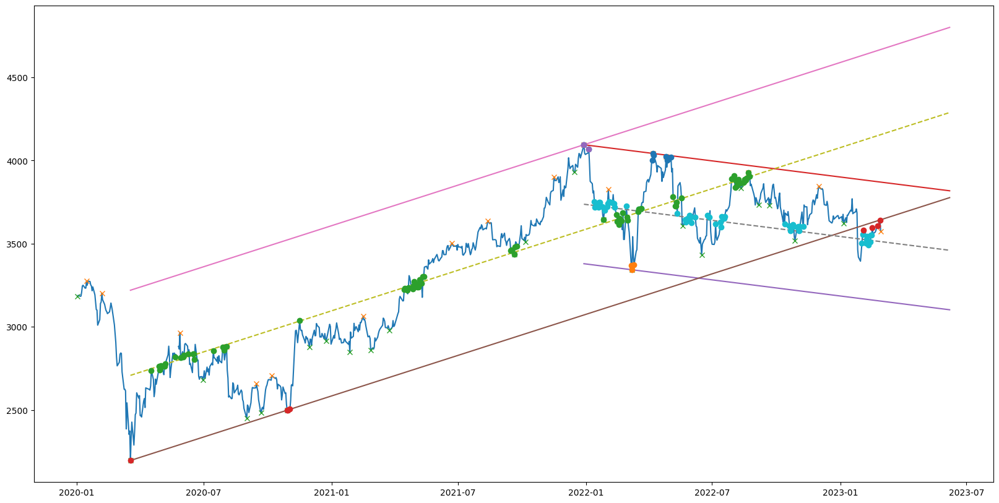

INF.L


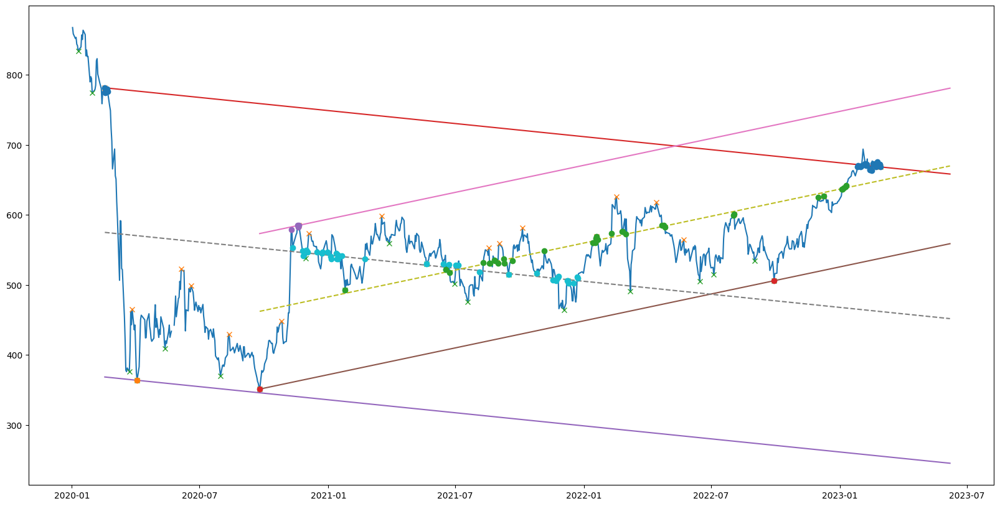

UU.L


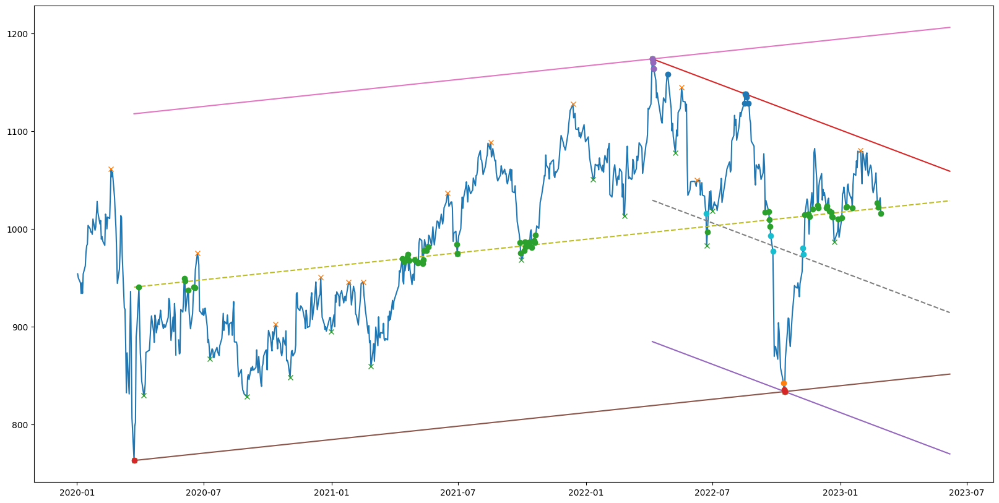

PSHP.L


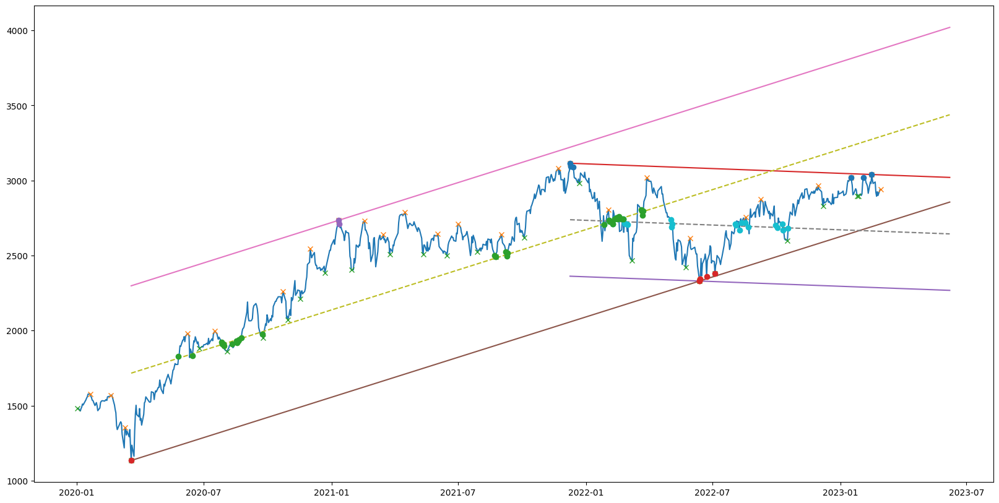

WTB.L


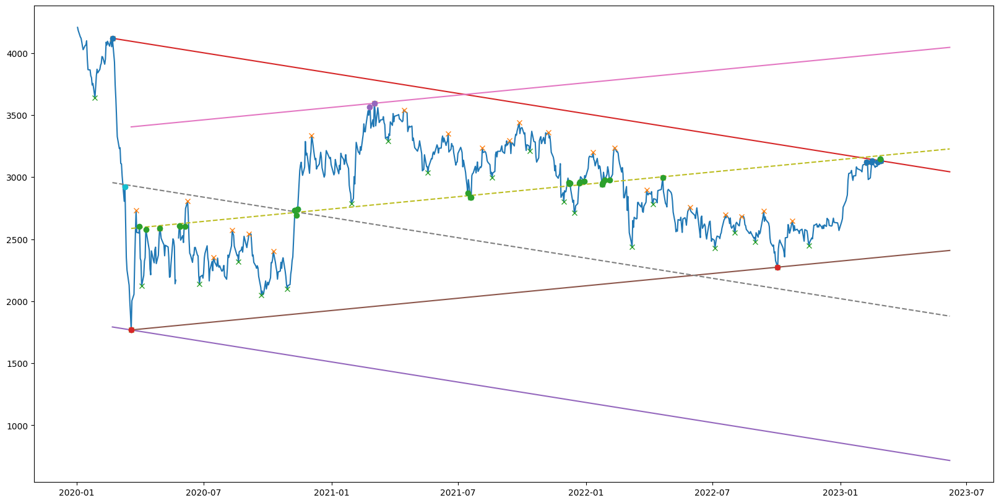

PRU.L


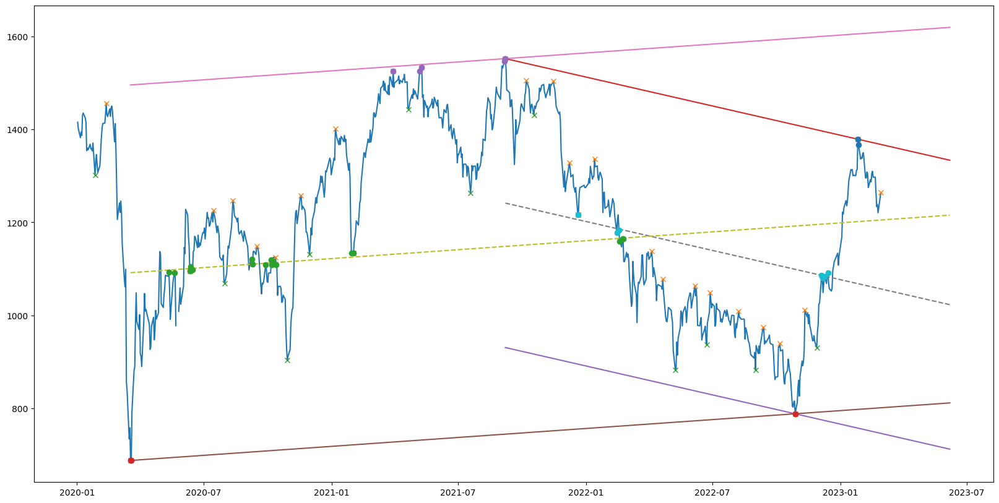

MKS.L


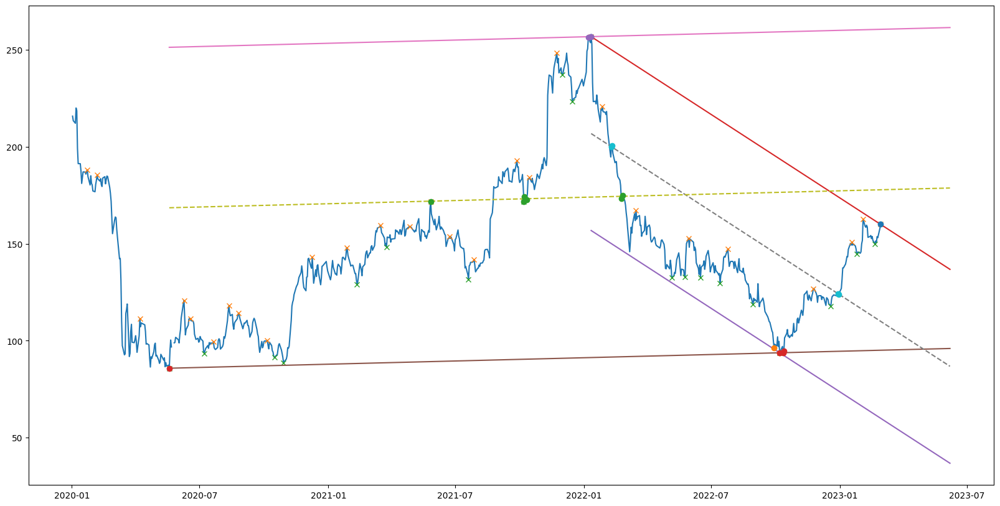

EXPN.L


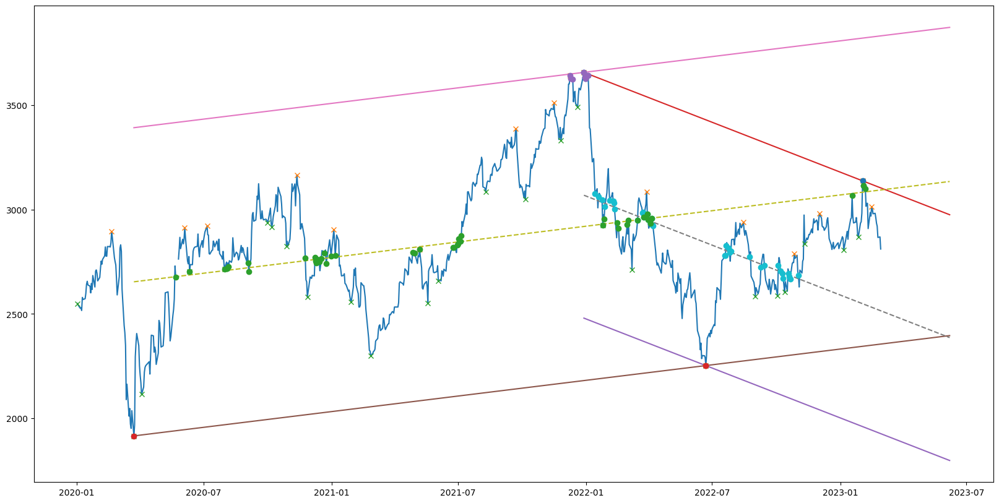

RS1R.L


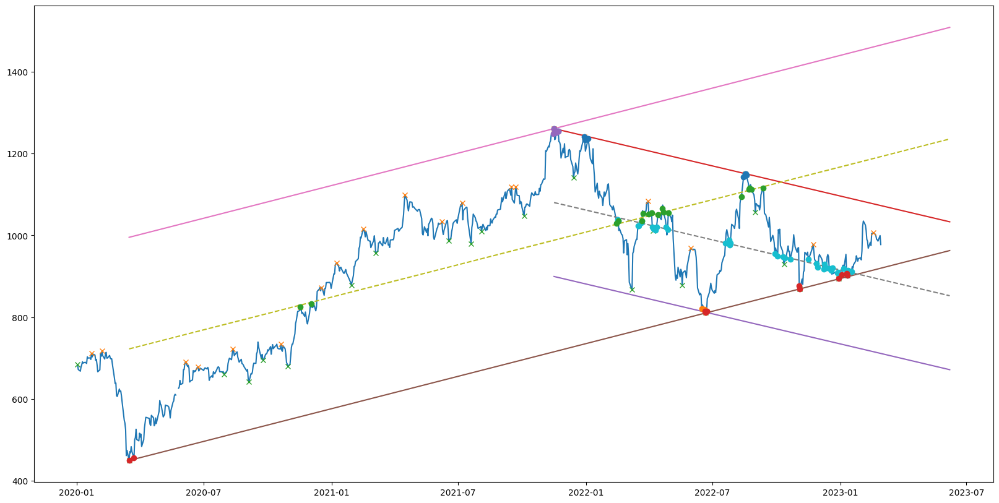

GSK.L


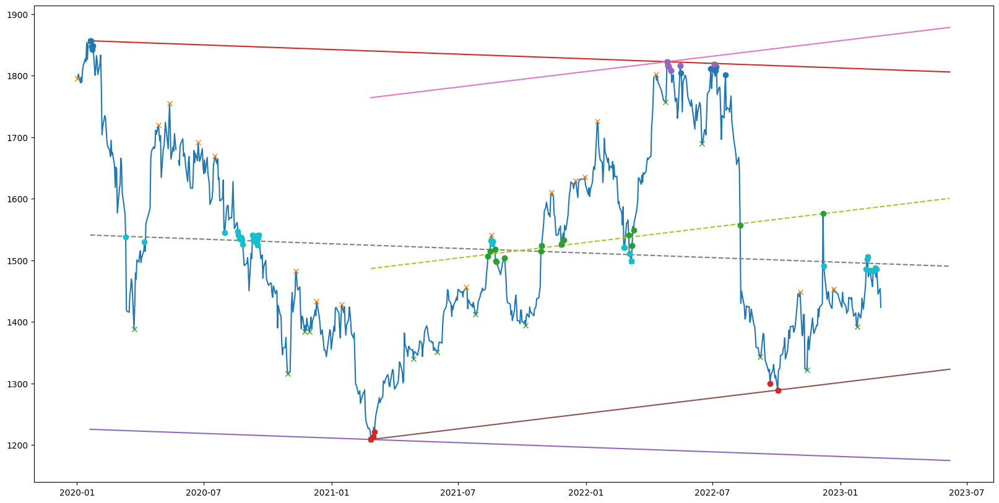

LAND.L


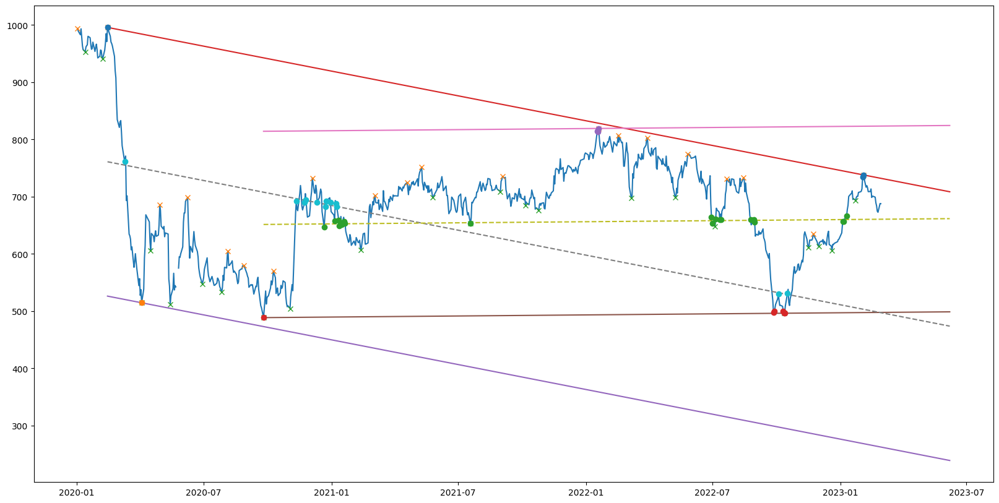

BEZG.L


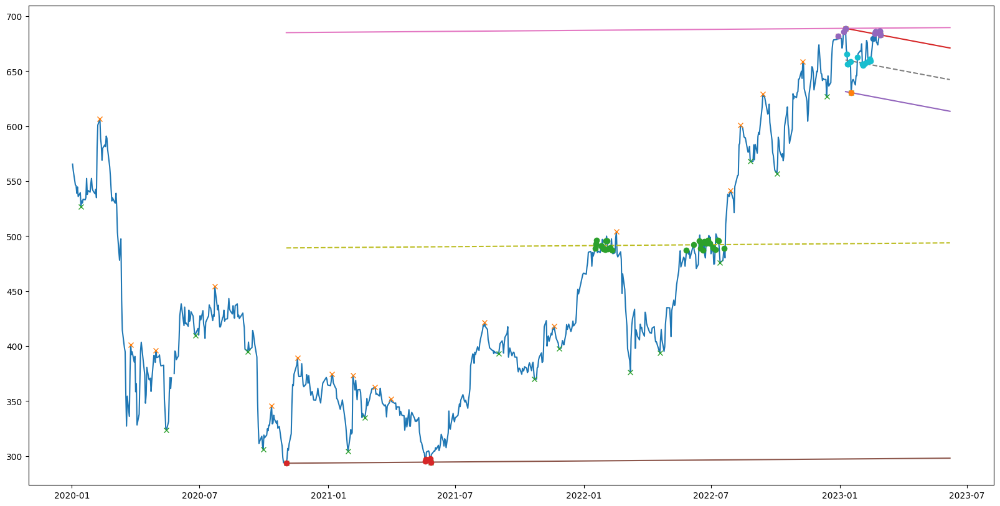

JD.L


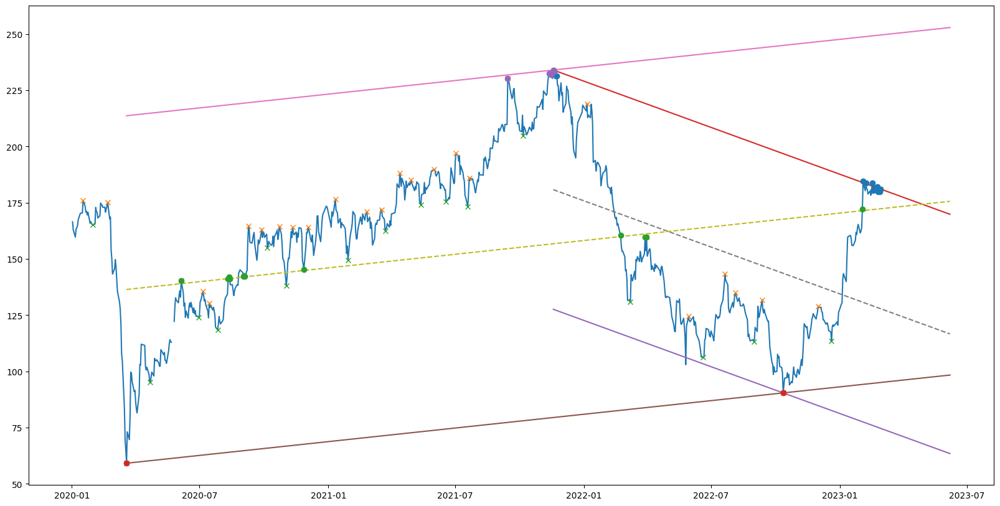

ABF.L


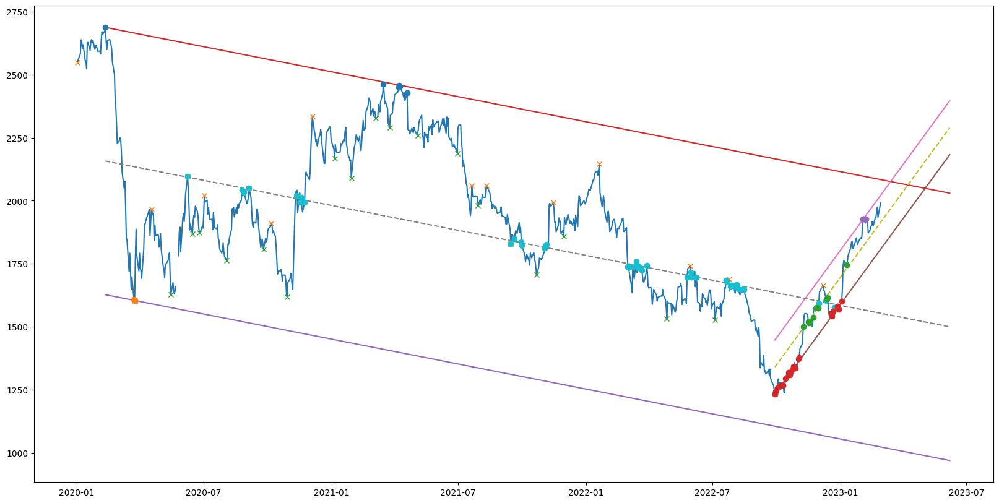

AAL.L


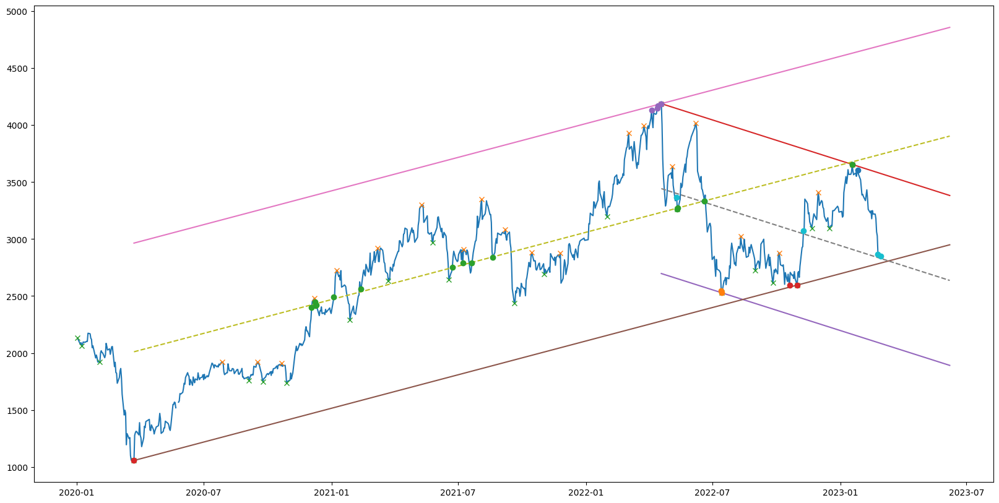

ADML.L


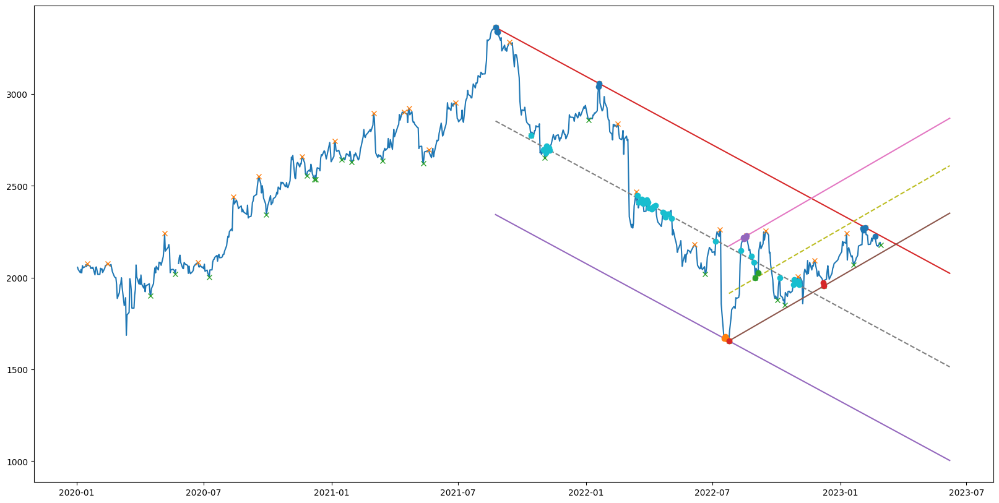

RTO.L


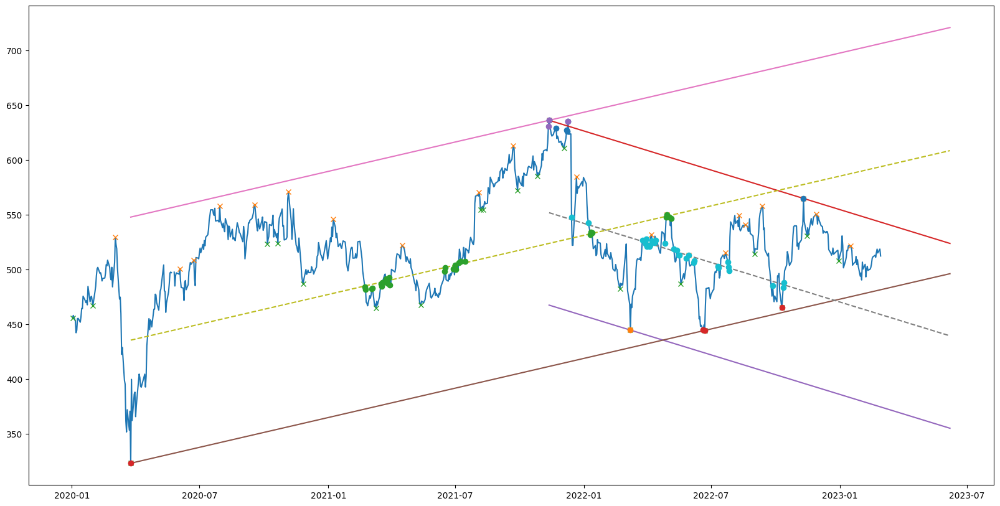

RMV.L


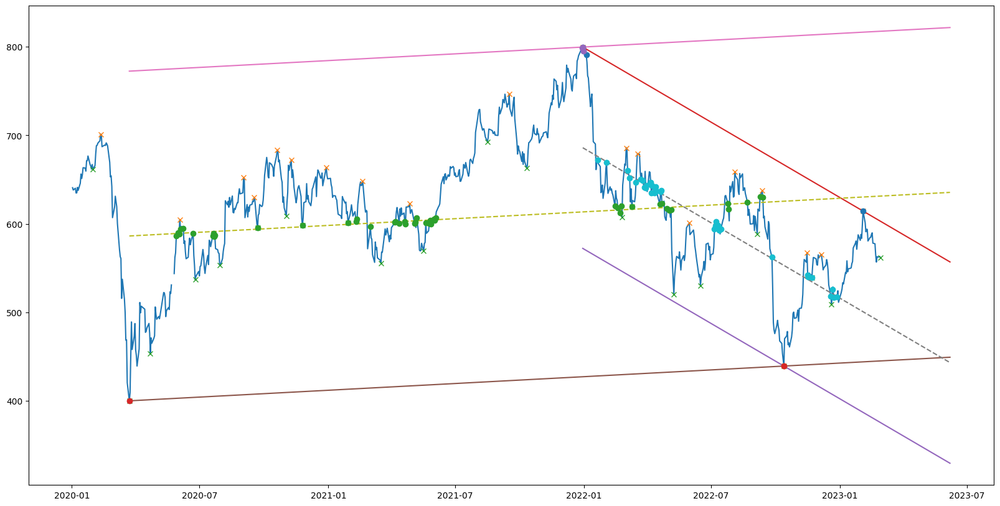

SBRY.L


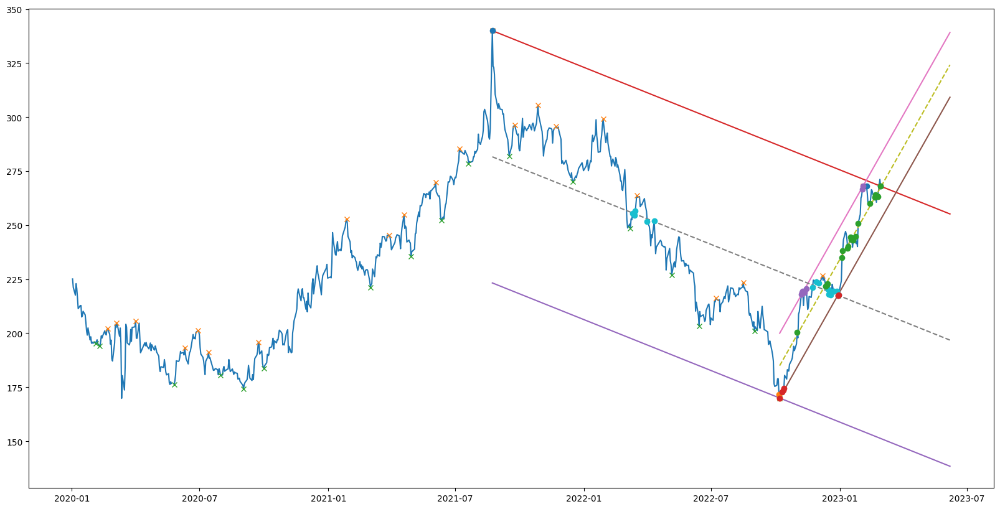

PHNX.L


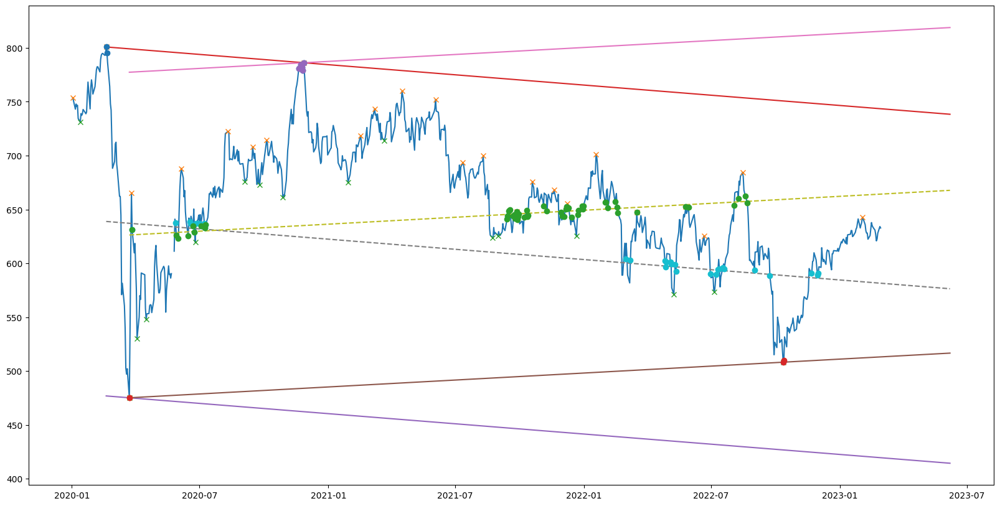

FLTRF.L


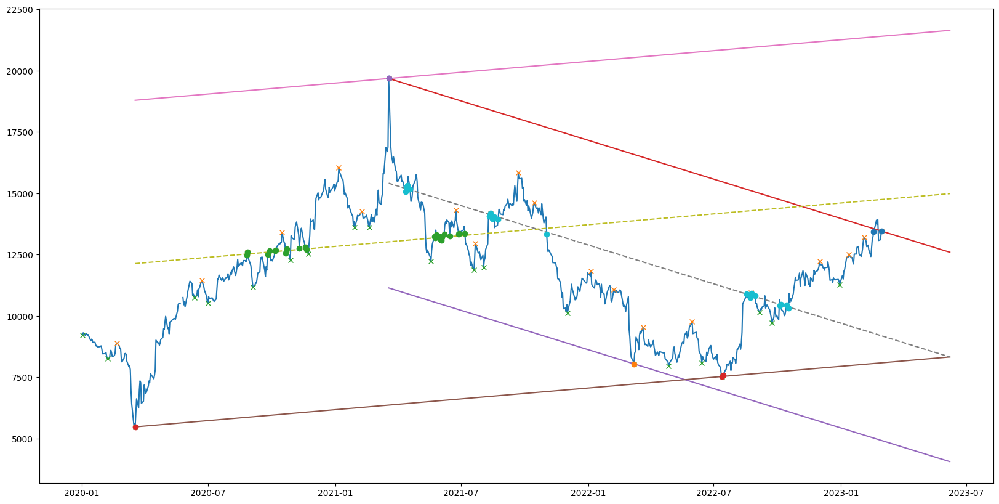

BT.L


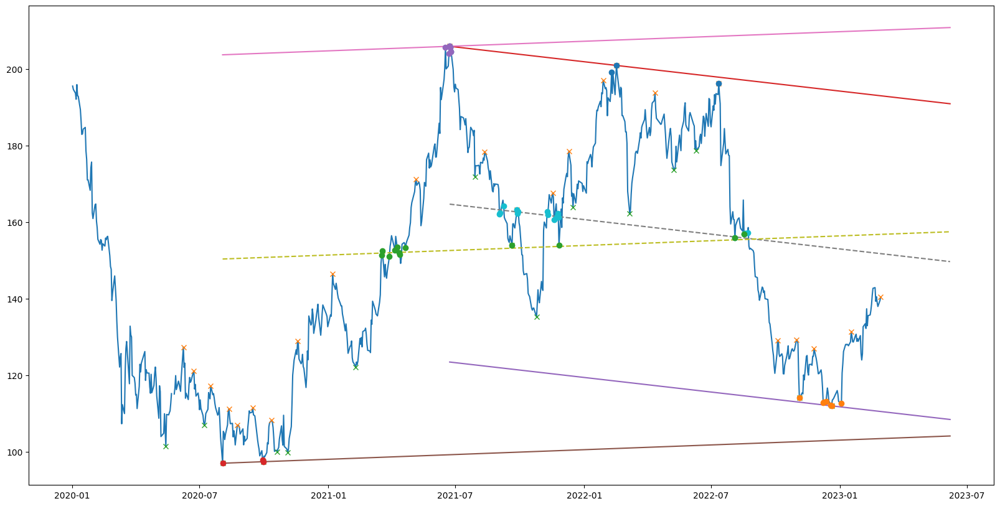

MNDI.L


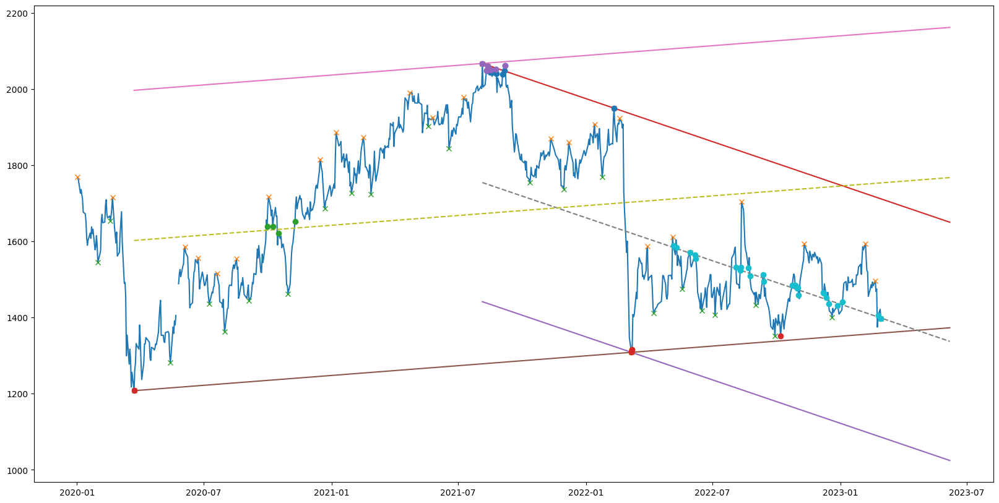

BATS.L


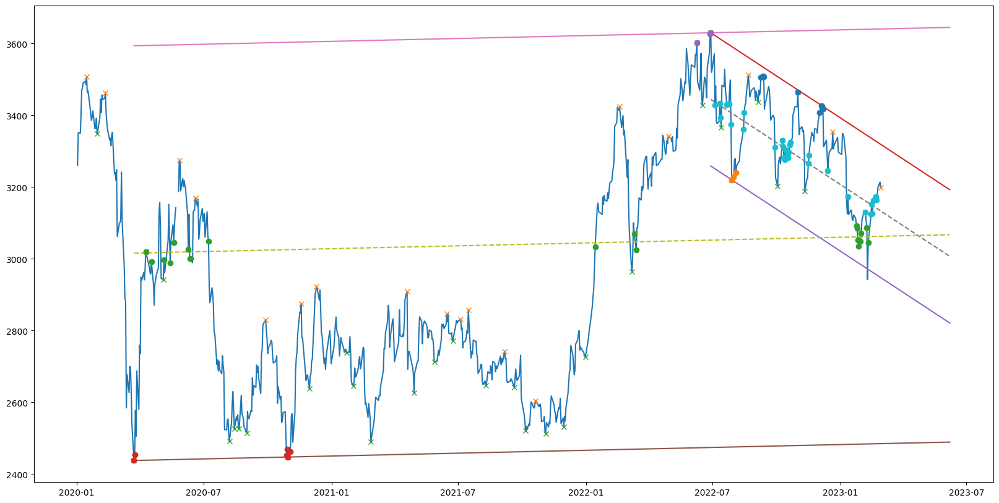

PSON.L


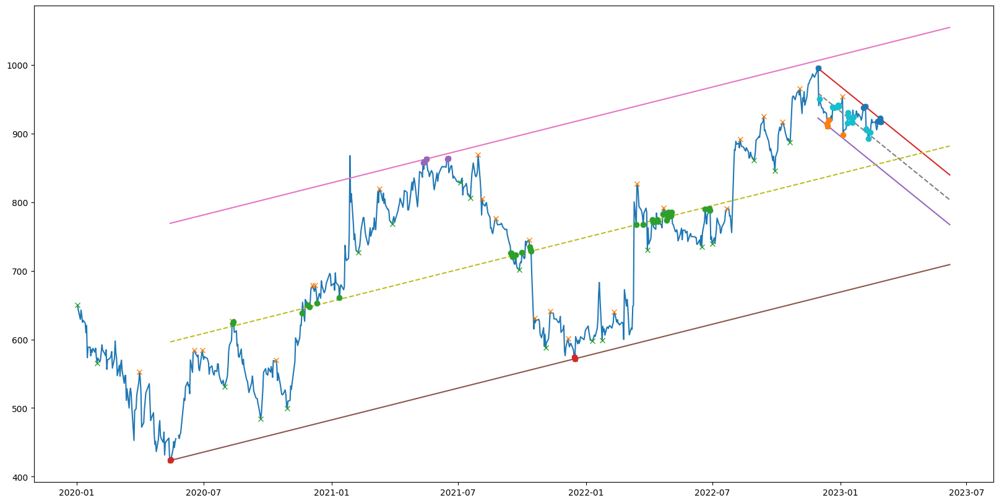

SPX.L


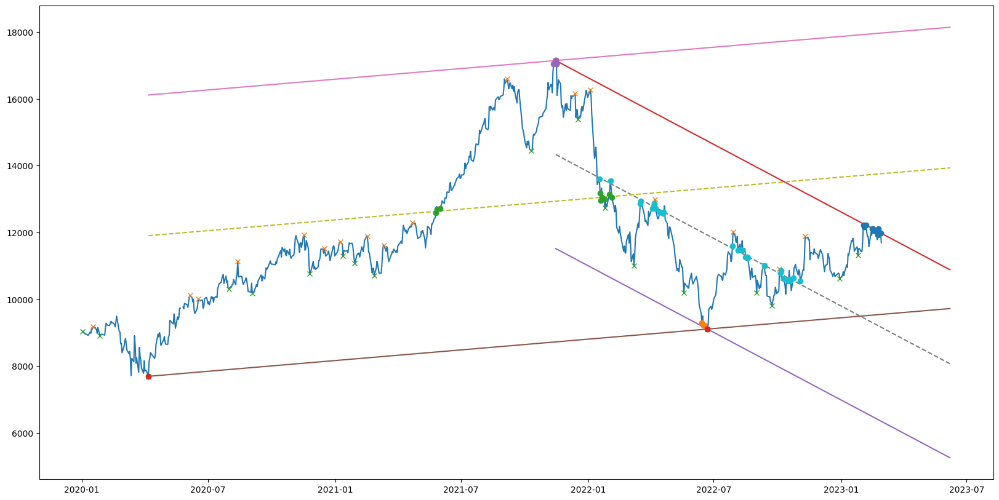

RIO.L


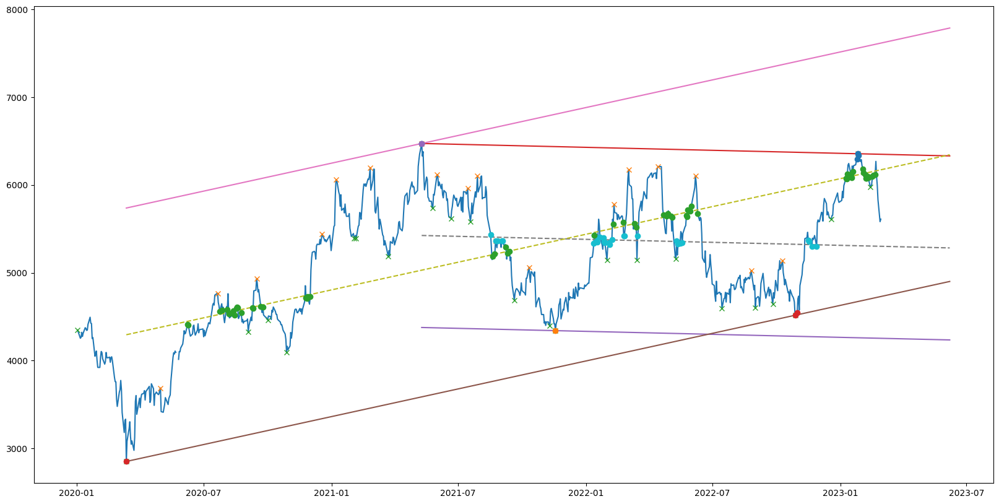

CCH.L


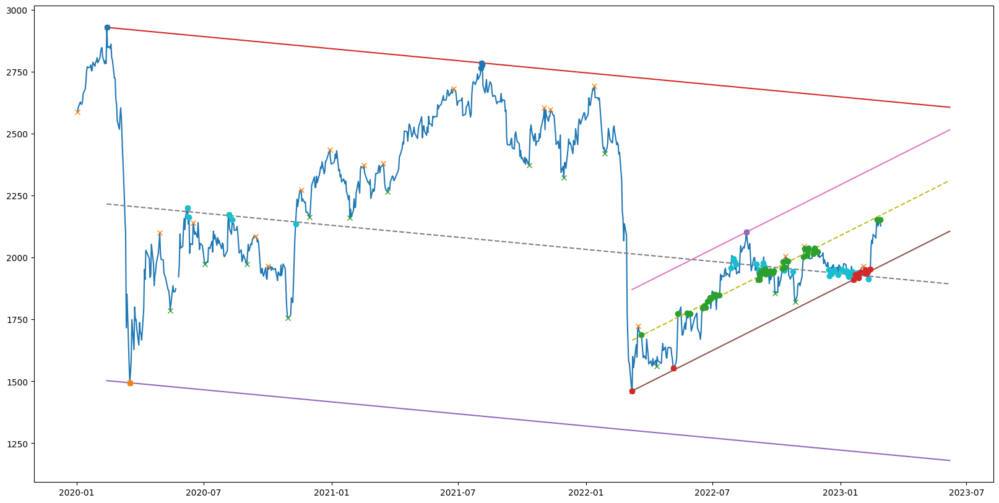

RR.L


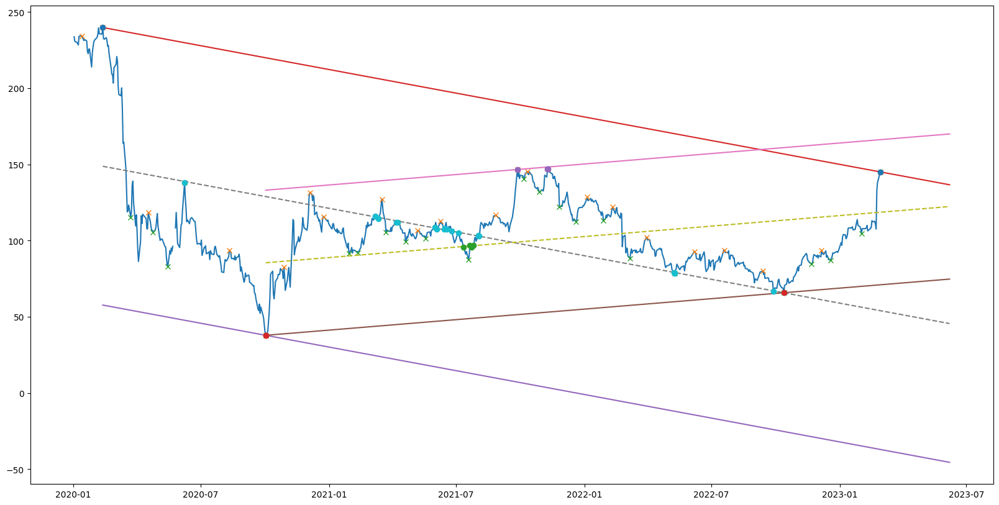

SN.L


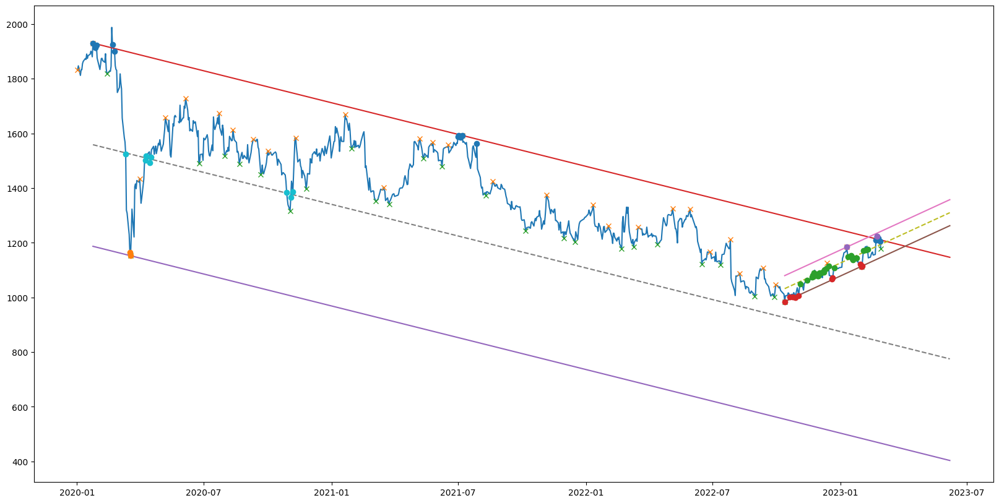

BMEB.L


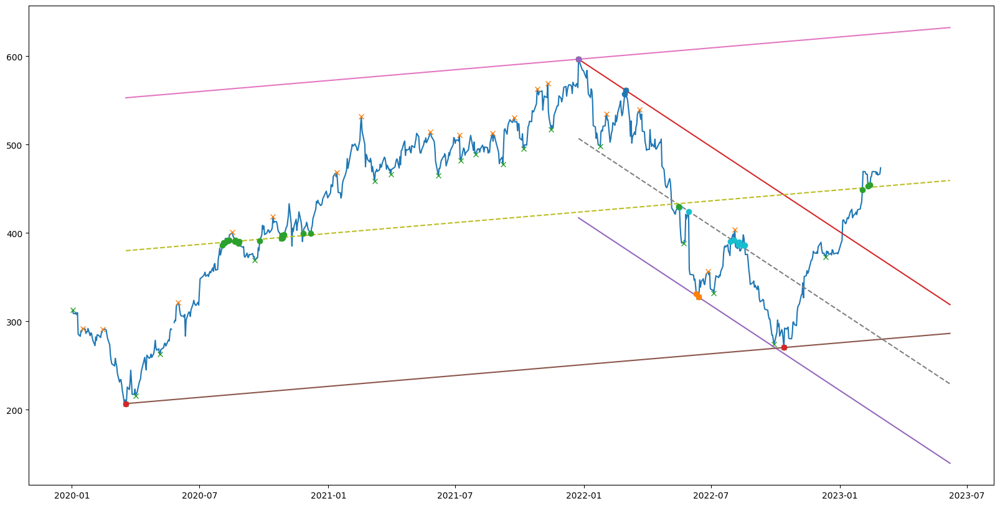

SSE.L


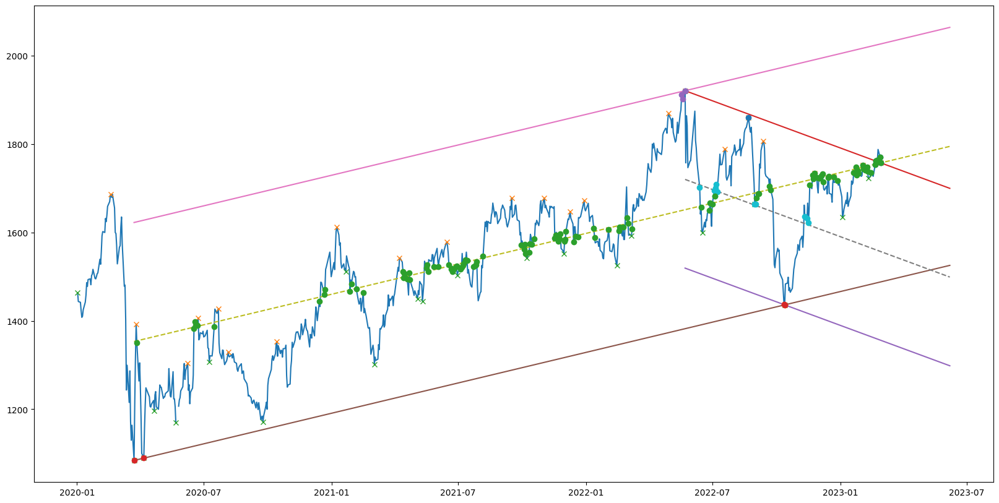

SMT.L


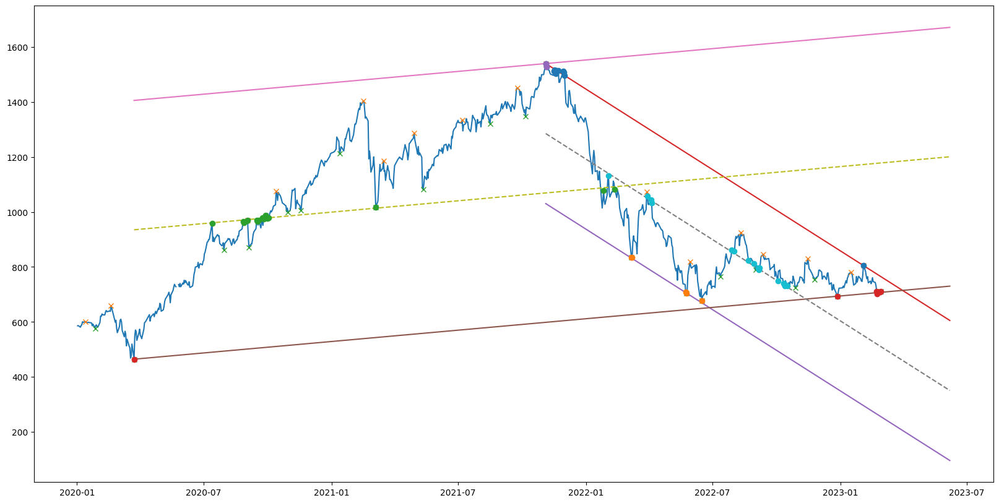

FRAS.L


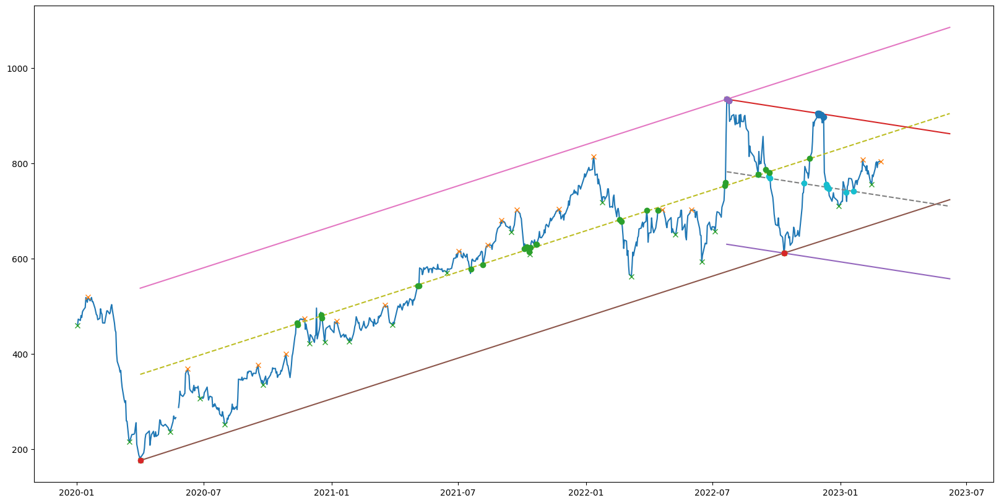

KGF.L


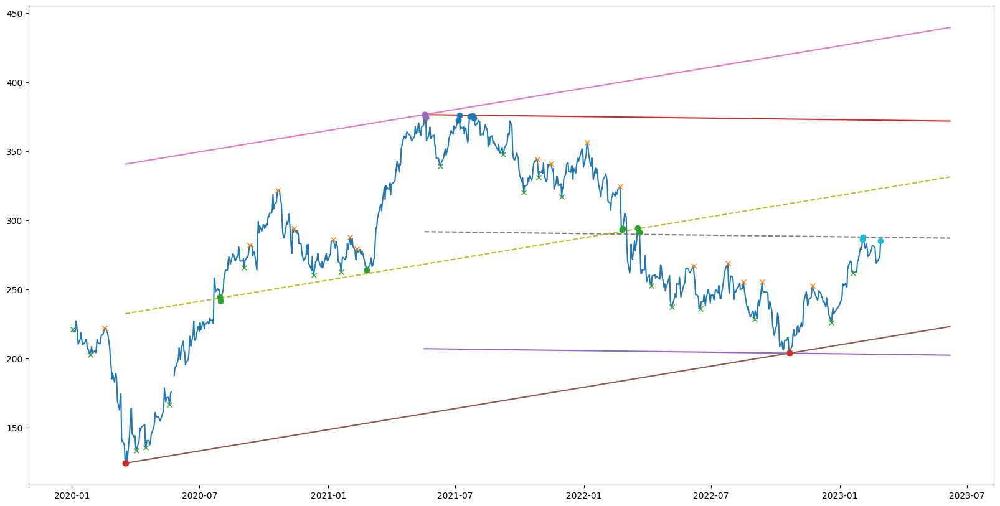

LLOY.L


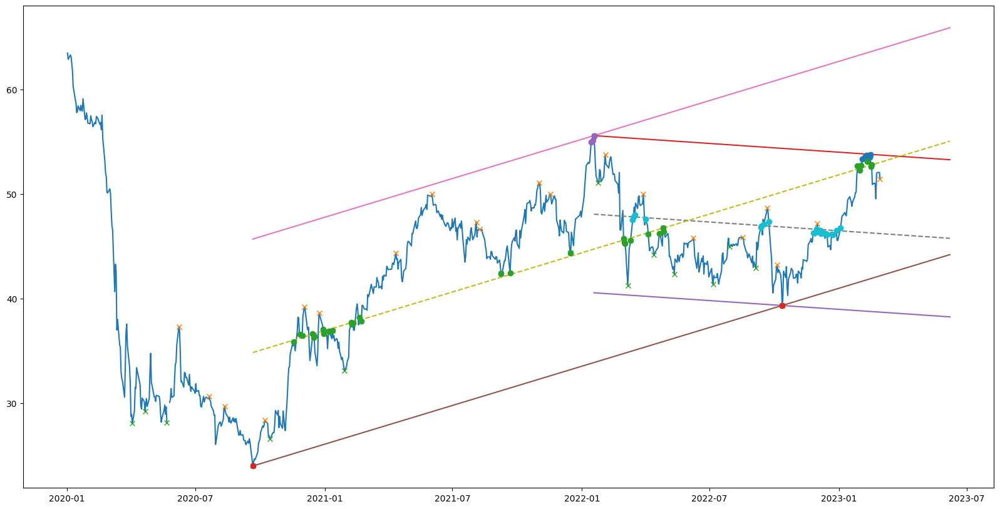

NWG.L


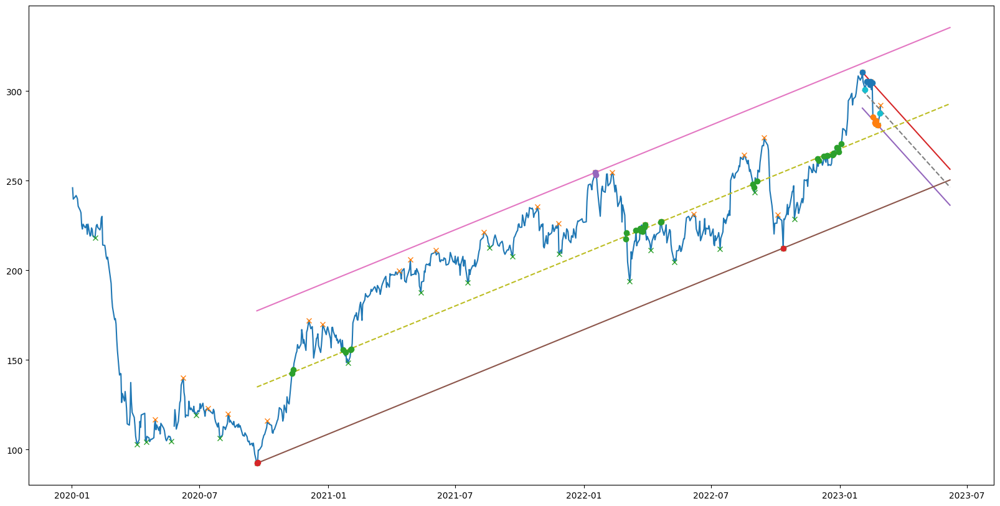

SDR.L


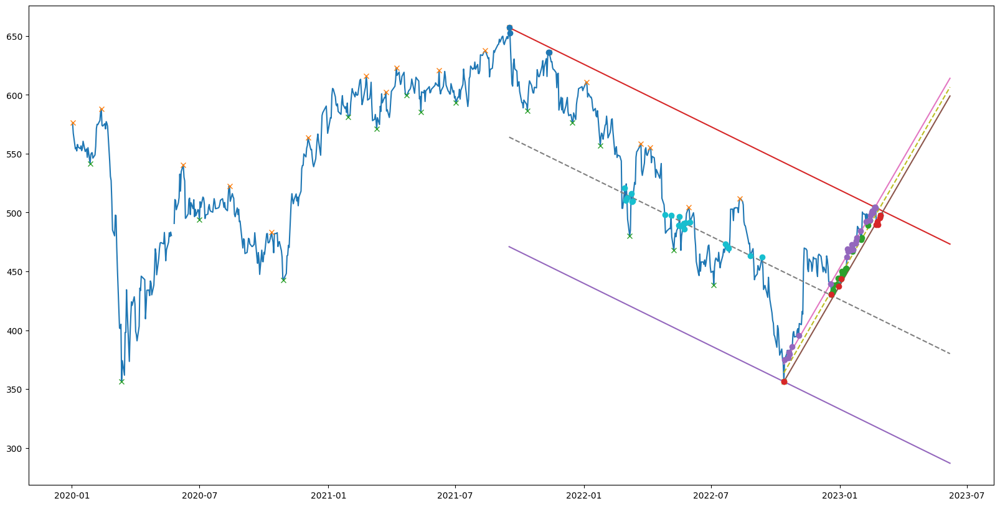

NXT.L


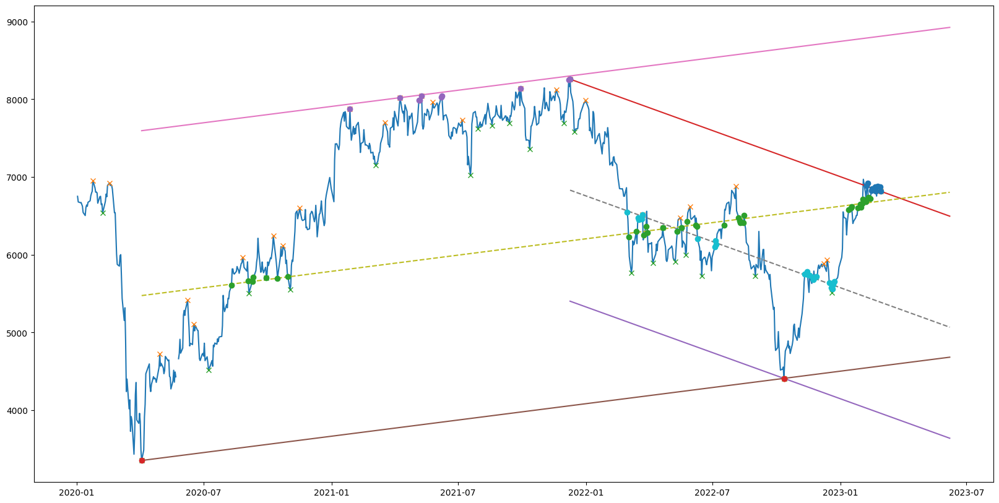

ITRK.L


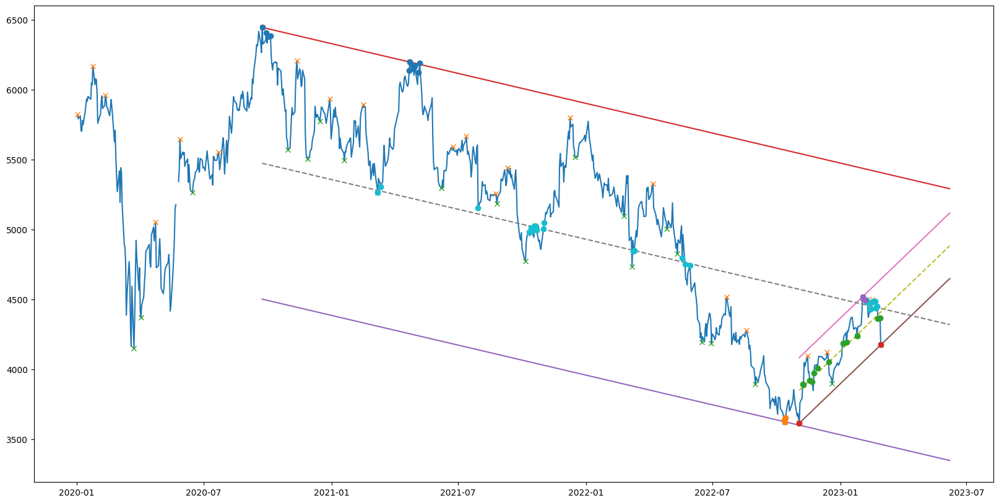

BDEV.L


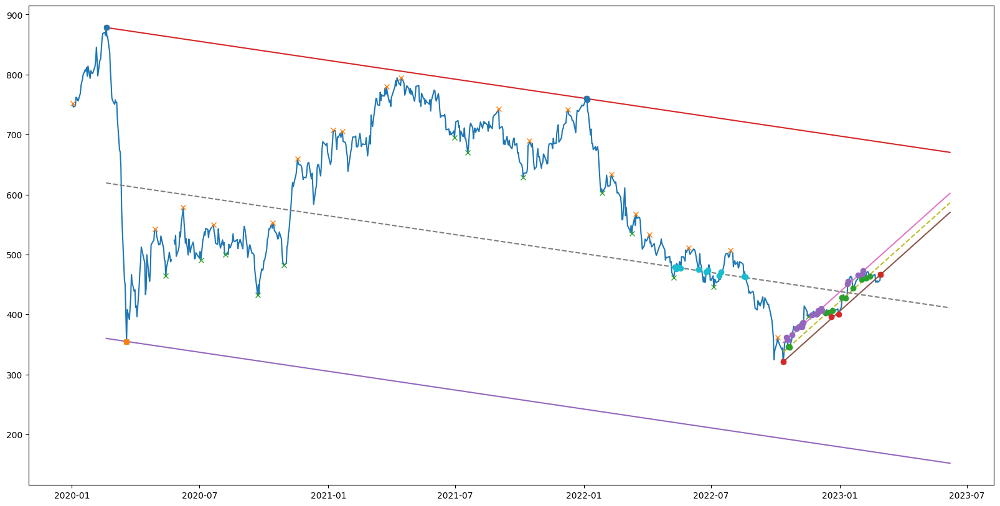

GLEN.L


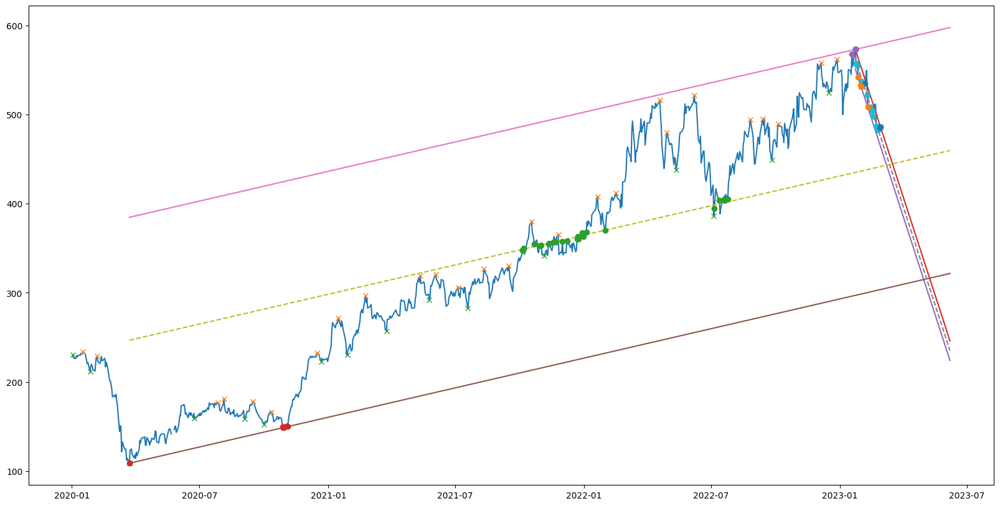

BARC.L


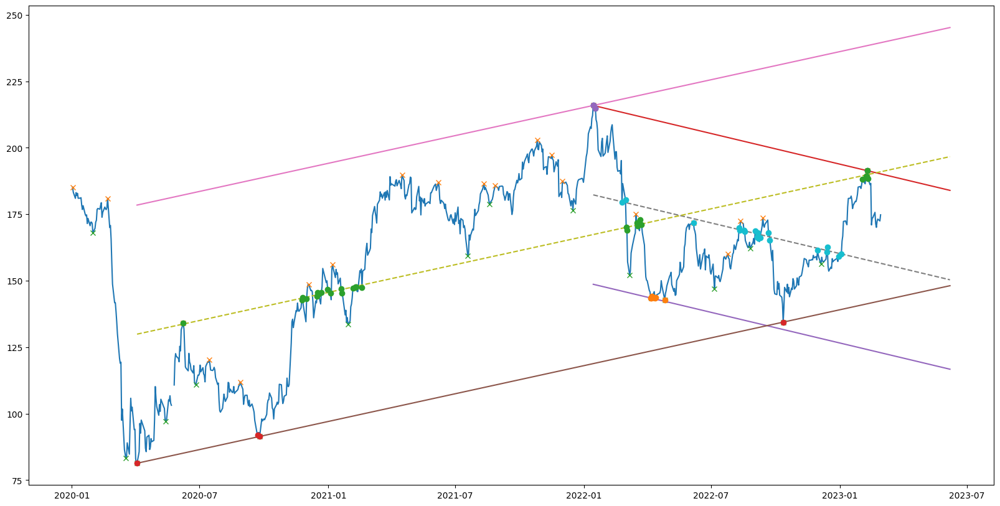

UTG.L


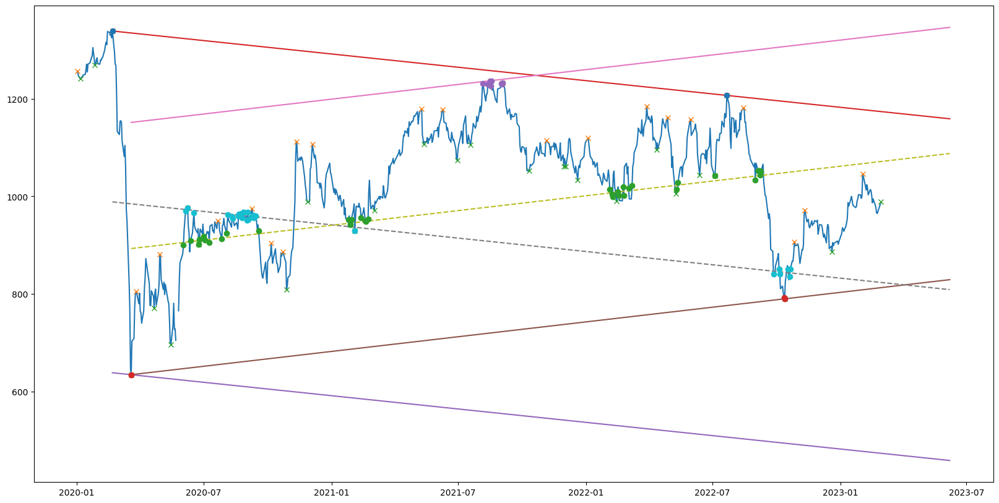

DPLM.L


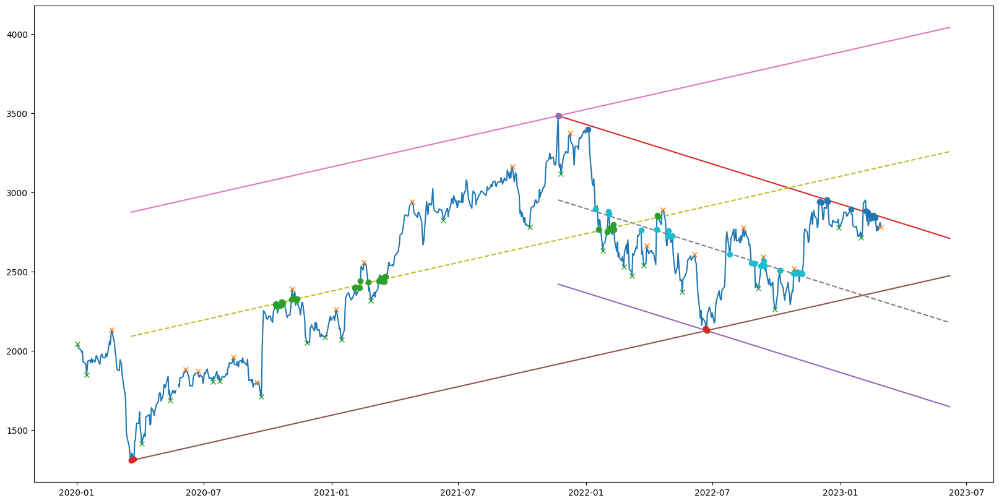

ICP.L


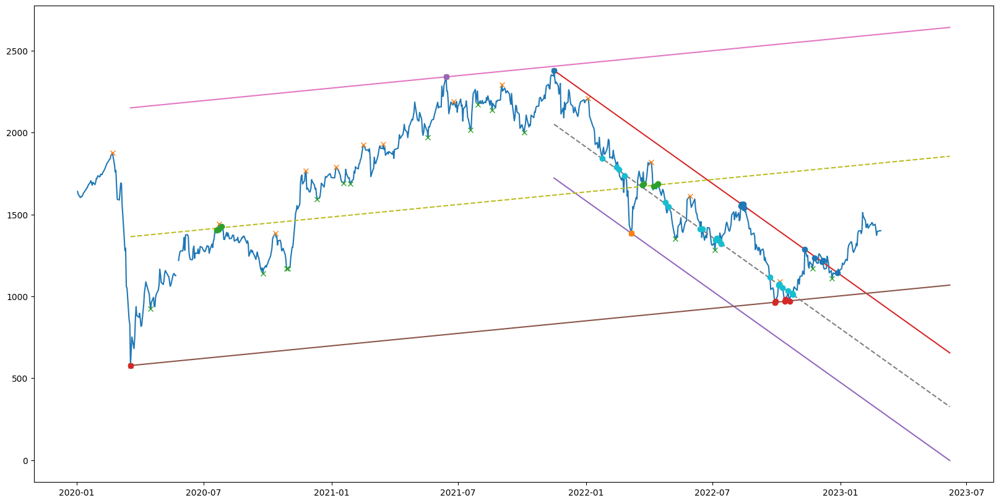

DCC.L


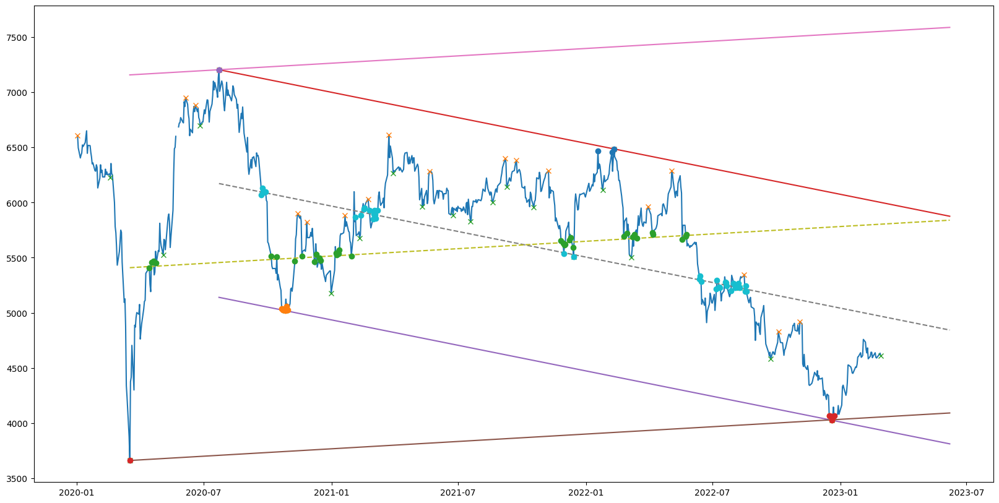

ULVR.L


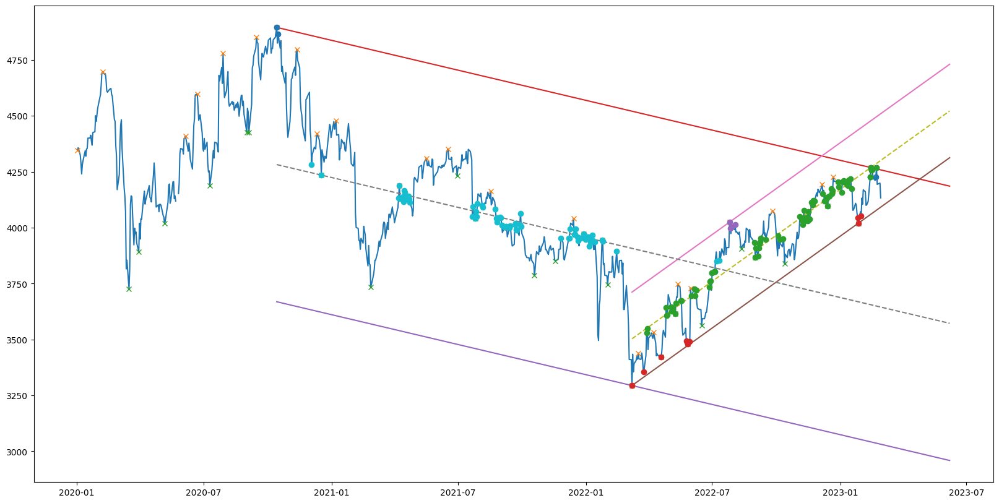

OCDO.L


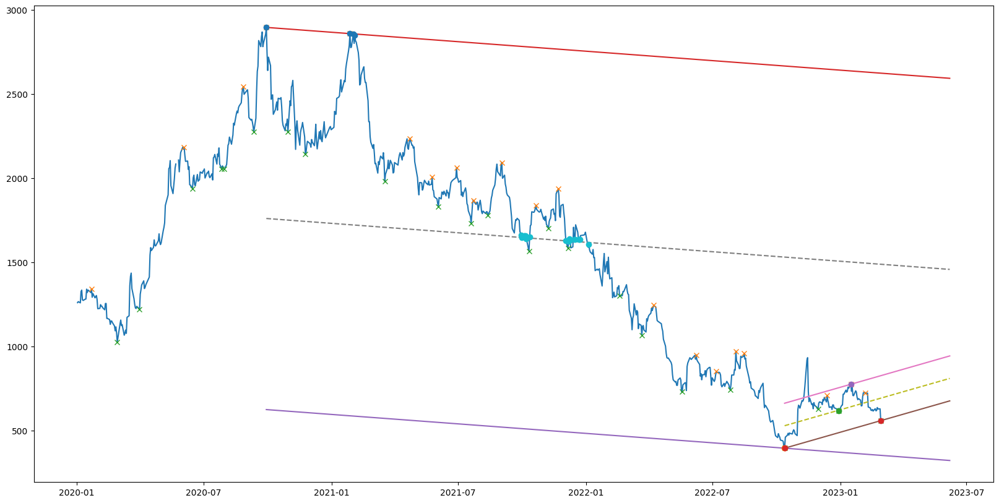

LSEG.L


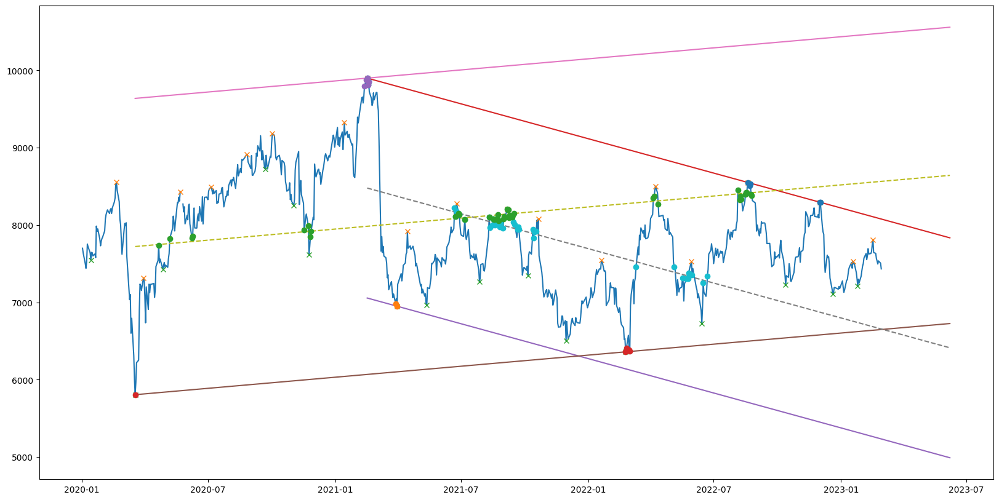

TSCO.L


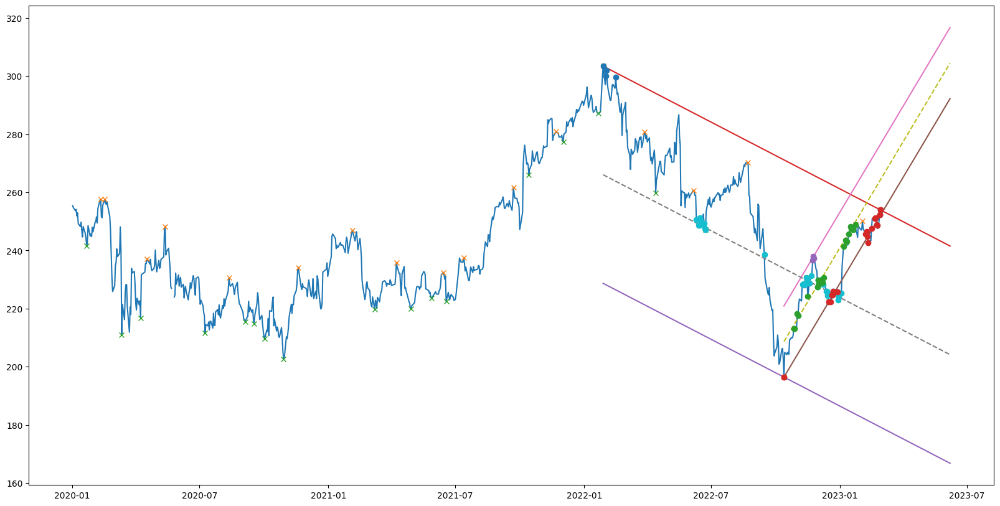

LGEN.L


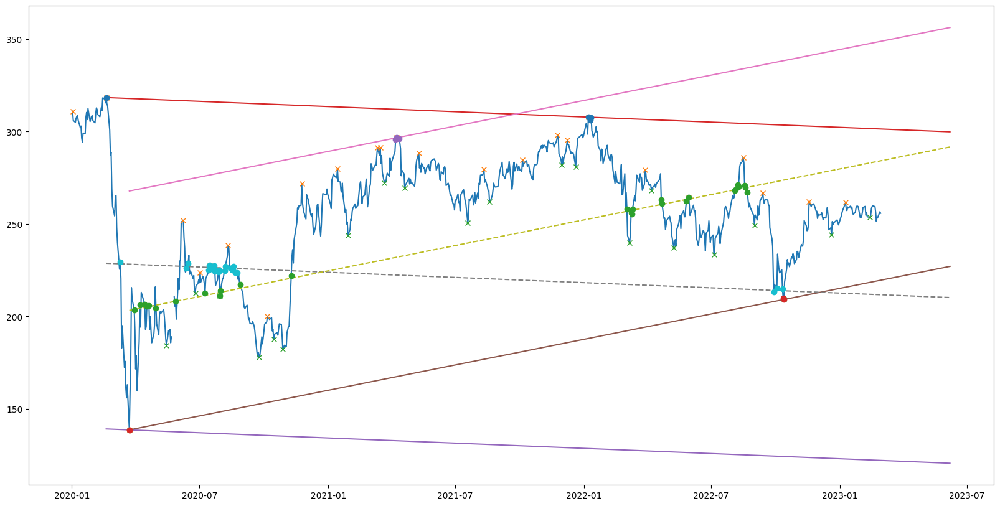

In [13]:
for stock in all_stock_df.columns.get_level_values(0).unique():
    try:
        print(stock)
        plot_trendlines(all_stock_df, stock)
    except Exception as e:
        print(stock,e)

* ### Conclusion

  * #### Possible to automate trendline and channel generation using simple linear geometry and python
  * #### Possible to calculate potential relevance of lines using novel features
  * #### Possible to provide forward looking timeframes of intersection
  * #### Possible to provide forward looking extrapolations of support and/or resistance
  * #### Compressions might be the interaction of two channels Sup1 with Res2

* ### Possible Extensions

  * #### Identify ascending, decending, equalateral compressions and other novel features
  * #### Add volume confirmation
  * #### Generate (market cap adjusted) averages for entire sectors
  * #### +++ anything you can imagine
  